In [1]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
%matplotlib inline
%config InlineBackend.figure_format='retina'
import cmocean
import cartopy.crs as ccrs
import matplotlib.path as mpath
import nc_time_axis
import pandas as pd
import matplotlib as mpl
import momlevel as ml
import gcsfs
import zarr
from matplotlib.ticker import FormatStrFormatter

In [2]:
def south_pole_map(cols=1, rows=1, fig_size=(12,8), max_extent=-50, facecolor='white'):
    ''' 
    User note: In order to call the function, begin cell with: fig, ax = south_pole_map(**args).
    
    Neglecting "fig, ax =" at the begeinning will not map your data to the existing axes.
    
    This function sets up a polar projection centered at the South Pole, which DataArrays can be plotted over.
    
    Optional arguments accepted for figure size, maximum (northward) extent and facecolor. Any number of columns and/or rows are also accepted for multiple subplots.
    
    If creating multiple subplots, ax=ax[*index*] must be passed in the plot call for each array.
    
    By default, these are set to (12,8), -50ºS and gray, respectively. Columns/Rows set to 1 by default – specifying axes in which to plot data is not necessary when using default column number.
    '''
    import matplotlib.path as mpath
    import numpy as np
    import cartopy.crs as ccrs
    
    fig,ax = plt.subplots(figsize=fig_size, ncols=cols, nrows=rows, subplot_kw={'projection': ccrs.SouthPolarStereo(), 'facecolor':facecolor}, layout='constrained')

    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    
    if rows>1 and cols>1:
        for i in range(rows):
            for j in range(cols):
                ax[i,j].set_boundary(circle, transform=ax[i,j].transAxes)

                # lat/long map extents. shows south pole out to 50ºS
                ax[i,j].set_extent([-180, 180, -90, max_extent], ccrs.PlateCarree())
    elif cols>1 and rows==1:
        for i in range(cols):
            ax[i].set_boundary(circle, transform=ax[i].transAxes)

            # lat/long map extents. shows south pole out to 50ºS
            ax[i].set_extent([-180, 180, -90, max_extent], ccrs.PlateCarree())
    elif rows>1 and cols==1:
        for i in range(rows):
            ax[i].set_boundary(circle, transform=ax[i].transAxes)

            # lat/long map extents. shows south pole out to 50ºS
            ax[i].set_extent([-180, 180, -90, max_extent], ccrs.PlateCarree())
    else:
        ax.set_boundary(circle, transform=ax.transAxes)

            # lat/long map extents. shows south pole out to 50ºS
        ax.set_extent([-180, 180, -90, max_extent], ccrs.PlateCarree())
    
    
    #must return fig, ax when creating multiple subplots in a function
    return fig, ax

In [3]:
mask_CM4= xr.open_dataset('/home/pachamama/shared/antarctica_mask/CM4_mask_antarctica.nc')
mask_ESM4= xr.open_dataset('/home/pachamama/shared/antarctica_mask/ESM4_mask_antarctica.nc')
mask_ERA5= xr.open_dataset('/home/pachamama/shared/antarctica_mask/ERA5_mask_antarctica.nc')

# <span style="color:red">1979-2018</span>

In [4]:
google_cloud_cmip6 = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')


In [5]:
gfdl_esm4_precip_data = google_cloud_cmip6.query(
    # "activity_id=='ScenarioMIP' & \
    "table_id == 'Amon' & \
    variable_id == 'prsn' & \
    experiment_id == 'historical' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4' & \
    member_id == 'r1i1p1f1'"	
    )
     

In [6]:
gfdl_cm4_precip_data = google_cloud_cmip6.query(
    #"activity_id=='ScenarioMIP' & \
    "table_id == 'Amon' & \
    variable_id == 'prsn' & \
    experiment_id == 'historical' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-CM4'"
)

In [7]:
gfdl_esm4_precip_data

,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,zstore,dcpp_init_year,version
244714,CMIP,NOAA-GFDL,GFDL-ESM4,historical,r1i1p1f1,Amon,prsn,gr1,gs://cmip6/CMIP6/CMIP/NOAA-GFDL/GFDL-ESM4/hist...,NaN,20190726


In [8]:
gfdl_cm4_precip_data

,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,zstore,dcpp_init_year,version
6264,CMIP,NOAA-GFDL,GFDL-CM4,historical,r1i1p1f1,Amon,prsn,gr1,gs://cmip6/CMIP6/CMIP/NOAA-GFDL/GFDL-CM4/histo...,NaN,20180701


In [9]:
gcs = gcsfs.GCSFileSystem(token='anon')
zstore = gfdl_cm4_precip_data.zstore.values[-1]
mapper = gcs.get_mapper(zstore)

precip_cm4 = xr.open_zarr(mapper, consolidated=True)
precip_cm4

<xarray.Dataset>
Dimensions:    (bnds: 2, lat: 180, lon: 288, time: 1980)
Coordinates:
  * bnds       (bnds) float64 1.0 2.0
  * lat        (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
    lat_bnds   (lat, bnds) float64 dask.array<chunksize=(180, 2), meta=np.ndarray>
  * lon        (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
    lon_bnds   (lon, bnds) float64 dask.array<chunksize=(288, 2), meta=np.ndarray>
  * time       (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
    time_bnds  (time, bnds) object dask.array<chunksize=(1980, 2), meta=np.ndarray>
Data variables:
    prsn       (time, lat, lon) float32 dask.array<chunksize=(600, 180, 288), meta=np.ndarray>
Attributes: (12/49)
    Conventions:            CF-1.7 CMIP-6.0 UGRID-1.0
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   0.0
    branch_time_in_parent:  36500.0
    comment:                <null ref>
    ...                     ...
    variable_id:            prsn
    variant_info:           N/A
    variant_label:          r1i1p1f1
    status:                 2019-08-07;created;by nhn2@columbia.edu
    netcdf_tracking_ids:    hdl:21.14100/74ad1c96-57ac-4c4d-960e-365800958638...
    version_id:             v20180701

In [10]:
gcs = gcsfs.GCSFileSystem(token='anon')
zstore = gfdl_esm4_precip_data.zstore.values[-1]
mapper = gcs.get_mapper(zstore)

precip_esm4 = xr.open_zarr(mapper, consolidated=True)
precip_esm4

<xarray.Dataset>
Dimensions:    (bnds: 2, lat: 180, lon: 288, time: 1980)
Coordinates:
  * bnds       (bnds) float64 1.0 2.0
  * lat        (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
    lat_bnds   (lat, bnds) float64 dask.array<chunksize=(180, 2), meta=np.ndarray>
  * lon        (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
    lon_bnds   (lon, bnds) float64 dask.array<chunksize=(288, 2), meta=np.ndarray>
  * time       (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
    time_bnds  (time, bnds) object dask.array<chunksize=(1980, 2), meta=np.ndarray>
Data variables:
    prsn       (time, lat, lon) float32 dask.array<chunksize=(600, 180, 288), meta=np.ndarray>
Attributes: (12/49)
    Conventions:            CF-1.7 CMIP-6.0 UGRID-1.0
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   0.0
    branch_time_in_parent:  36500.0
    comment:                <null ref>
    ...                     ...
    variable_id:            prsn
    variant_info:           N/A
    variant_label:          r1i1p1f1
    status:                 2019-09-10;created;by nhn2@columbia.edu
    netcdf_tracking_ids:    hdl:21.14100/4b33531d-5a7a-4804-b0bf-a847f051632d...
    version_id:             v20190726

In [11]:
#selecting precip variable
ESM4_historical_prsn= precip_esm4.prsn.sel(time=slice('1979-01-01','2014-12-01'))
CM4_historical_prsn=precip_cm4.prsn.sel(time=slice('1979-01-01','2014-12-01'))

In [12]:
ERA5_snowfall_data= xr.open_mfdataset('/home/tu.temple.edu/tuo59681/era5/snowfall_ensemble/era5_mean_snowfall_rate_1940-2024_monthly_ensemble.nc')


In [13]:
ERA5_snowfall= ERA5_snowfall_data.msr

In [14]:
#combining the expver 1 and 5 values into one data set to remove the dimension
ERA5_combine =ERA5_snowfall.sel(expver=1).combine_first(ERA5_snowfall.sel(expver=5))
ERA5_combine.load()

<xarray.DataArray 'msr' (time: 1013, number: 10, latitude: 361, longitude: 720)>
array([[[[4.6868518e-06, 4.6868518e-06, 4.6868518e-06, ...,
          4.6868518e-06, 4.6868518e-06, 4.6868518e-06],
         [5.2065589e-06, 5.2160904e-06, 5.2208634e-06, ...,
          5.1922543e-06, 5.2017858e-06, 5.2065589e-06],
         [5.7834695e-06, 5.7930010e-06, 5.8025471e-06, ...,
          5.7501020e-06, 5.7596335e-06, 5.7643920e-06],
         ...,
         [1.3731624e-06, 1.3731624e-06, 1.3779354e-06, ...,
          1.3731624e-06, 1.3731624e-06, 1.3731624e-06],
         [1.4017714e-06, 1.4017714e-06, 1.4065299e-06, ...,
          1.4017714e-06, 1.4017714e-06, 1.4017714e-06],
         [1.6353879e-06, 1.6353879e-06, 1.6353879e-06, ...,
          1.6353879e-06, 1.6353879e-06, 1.6353879e-06]],

        [[2.3076718e-06, 2.3076718e-06, 2.3076718e-06, ...,
          2.3076718e-06, 2.3076718e-06, 2.3076718e-06],
         [2.6271155e-06, 2.6318885e-06, 2.6366615e-06, ...,
          2.6080525e-06, 2.6128109e-06, 2.6223570e-06],
         [2.9561052e-06, 2.9704097e-06, 2.9799412e-06, ...,
          2.9131916e-06, 2.9274961e-06, 2.9370276e-06],
...
         [1.5622511e-04, 1.5622511e-04, 1.5622511e-04, ...,
          1.5622511e-04, 1.5622511e-04, 1.5622511e-04],
         [1.5622511e-04, 1.5622511e-04, 1.5622511e-04, ...,
          1.5622511e-04, 1.5622511e-04, 1.5622511e-04],
         [1.5622511e-04, 1.5622511e-04, 1.5622511e-04, ...,
          1.5622511e-04, 1.5622511e-04, 1.5622511e-04]],

        [[1.5622511e-04, 1.5622511e-04, 1.5622511e-04, ...,
          1.5622511e-04, 1.5622511e-04, 1.5622511e-04],
         [1.5622511e-04, 1.5622511e-04, 1.5622511e-04, ...,
          1.5622511e-04, 1.5622511e-04, 1.5622511e-04],
         [1.5622511e-04, 1.5622511e-04, 1.5622511e-04, ...,
          1.5622511e-04, 1.5622511e-04, 1.5622511e-04],
         ...,
         [1.5622511e-04, 1.5622511e-04, 1.5622511e-04, ...,
          1.5622511e-04, 1.5622511e-04, 1.5622511e-04],
         [1.5622511e-04, 1.5622511e-04, 1.5622511e-04, ...,
          1.5622511e-04, 1.5622511e-04, 1.5622511e-04],
         [1.5622511e-04, 1.5622511e-04, 1.5622511e-04, ...,
          1.5622511e-04, 1.5622511e-04, 1.5622511e-04]]]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * latitude   (latitude) float32 90.0 89.5 89.0 88.5 ... -89.0 -89.5 -90.0
  * number     (number) int32 0 1 2 3 4 5 6 7 8 9
  * time       (time) datetime64[ns] 1940-01-01 1940-02-01 ... 2024-05-01
Attributes:
    units:      kg m**-2 s**-1
    long_name:  Mean snowfall rate

In [15]:
#meaning number to remove the dimension and slicing time as historical
ERA5_snowfall_amount= ERA5_combine.mean('number').sel(time=slice('1979-01-01','2014-12-01'))

In [16]:
#calculating monthly seconds to convert precip units and getting annual and seasonal seconds
jan_sec=2678400
feb_sec=2419200
mar_sec=2678400
apr_sec=2592000
may_sec=2678400
jun_sec=2592000
jul_sec=2678400
aug_sec=2678400
sep_sec=2592000
oct_sec=2678400
nov_sec=2592000
dec_sec=2678400
ann_sec=jan_sec+feb_sec+mar_sec+apr_sec+may_sec+jun_sec+jul_sec+aug_sec+sep_sec+oct_sec+nov_sec+dec_sec
DJF_sec= dec_sec+jan_sec+feb_sec
JJA_sec= jun_sec+jul_sec+aug_sec
SON_sec = sep_sec+oct_sec+nov_sec
MAM_sec= mar_sec+apr_sec+may_sec

In [42]:
precip_seasonal_CM4 = CM4_historical_prsn.groupby('time.season').mean(dim='time')
precip_summer_CM4= precip_seasonal_CM4.sel(season= 'DJF')
precip_winter_CM4=precip_seasonal_CM4.sel(season='JJA')
precip_spring_CM4=precip_seasonal_CM4.sel(season='SON')
precip_fall_CM4=precip_seasonal_CM4.sel(season='MAM')

In [43]:
precip_seasonal_ESM4 = ESM4_historical_prsn.groupby('time.season').mean(dim='time')
precip_summer_ESM4= precip_seasonal_ESM4.sel(season= 'DJF')
precip_winter_ESM4=precip_seasonal_ESM4.sel(season='JJA')
precip_spring_ESM4=precip_seasonal_ESM4.sel(season='SON')
precip_fall_ESM4=precip_seasonal_ESM4.sel(season='MAM')

In [44]:
precip_seasonal_ERA5 = ERA5_snowfall_amount.groupby('time.season').mean(dim='time')
precip_summer_ERA5= precip_seasonal_ERA5.sel(season= 'DJF')
precip_winter_ERA5=precip_seasonal_ERA5.sel(season='JJA')
precip_spring_ERA5=precip_seasonal_ERA5.sel(season='SON')
precip_fall_ERA5=precip_seasonal_ERA5.sel(season='MAM')

In [46]:
precip_total_CM4=CM4_historical_prsn.mean('time')
precip_total_ESM4=ESM4_historical_prsn.mean('time')
precip_total_ERA5=ERA5_snowfall_amount.mean('time')

In [47]:

plateau_precip_CM4_bar=((precip_total_CM4*(mask_CM4.plateau_CM4)).mean('lat').mean('lon'))*(ann_sec)
ross_precip_CM4_bar=((precip_total_CM4*(mask_CM4.ross_CM4)).mean('lat').mean('lon'))*(ann_sec)
lowwest_precip_CM4_bar=((precip_total_CM4*(mask_CM4.lowwest_CM4)).mean('lat').mean('lon'))*(ann_sec)
loweast_precip_CM4_bar=((precip_total_CM4*(mask_CM4.loweast_CM4)).mean('lat').mean('lon'))*(ann_sec)
filchner_precip_CM4_bar=((precip_total_CM4*(mask_CM4.filchner_CM4)).mean('lat').mean('lon'))*(ann_sec)
peninsula_precip_CM4_bar=((precip_total_CM4*(mask_CM4.peninsula_CM4)).mean('lat').mean('lon'))*(ann_sec)

plateau_precip_ESM4_bar=((precip_total_ESM4*(mask_ESM4.plateau_ESM4)).mean('lat').mean('lon'))*(ann_sec)
ross_precip_ESM4_bar=(precip_total_ESM4*(mask_ESM4.ross_ESM4)).mean('lat').mean('lon')*(ann_sec)
lowwest_precip_ESM4_bar=(precip_total_ESM4*(mask_ESM4.lowwest_ESM4)).mean('lat').mean('lon')*(ann_sec)
loweast_precip_ESM4_bar=(precip_total_ESM4*(mask_ESM4.loweast_ESM4)).mean('lat').mean('lon')*(ann_sec)
filchner_precip_ESM4_bar=(precip_total_ESM4*(mask_ESM4.filchner_ESM4)).mean('lat').mean('lon')*(ann_sec)
peninsula_precip_ESM4_bar=(precip_total_ESM4*(mask_ESM4.peninsula_ESM4)).mean('lat').mean('lon')*(ann_sec)

plateau_precip_ERA5_bar=((precip_total_ERA5*(mask_ERA5.plateau_ERA5)).mean('latitude').mean('longitude'))*(ann_sec)
ross_precip_ERA5_bar=(precip_total_ERA5*(mask_ERA5.ross_ERA5)).mean('latitude').mean('longitude')*(ann_sec)
lowwest_precip_ERA5_bar=(precip_total_ERA5*(mask_ERA5.lowwest_ERA5)).mean('latitude').mean('longitude')*(ann_sec)
loweast_precip_ERA5_bar=(precip_total_ERA5*(mask_ERA5.loweast_ERA5)).mean('latitude').mean('longitude')*(ann_sec)
filchner_precip_ERA5_bar=(precip_total_ERA5*(mask_ERA5.filchner_ERA5)).mean('latitude').mean('longitude')*(ann_sec)
peninsula_precip_ERA5_bar=(precip_total_ERA5*(mask_ERA5.peninsula_ERA5)).mean('latitude').mean('longitude')*(ann_sec)

In [48]:
plateau_precip_summer_CM4=(precip_summer_CM4*(mask_CM4.plateau_CM4)).mean('lat').mean('lon')*DJF_sec
ross_precip_summer_CM4=(precip_summer_CM4*(mask_CM4.ross_CM4)).mean('lat').mean('lon')*DJF_sec
lowwest_precip_summer_CM4=(precip_summer_CM4*(mask_CM4.lowwest_CM4)).mean('lat').mean('lon')*DJF_sec
loweast_precip_summer_CM4=(precip_summer_CM4*(mask_CM4.loweast_CM4)).mean('lat').mean('lon')*DJF_sec
filchner_precip_summer_CM4=(precip_summer_CM4*(mask_CM4.filchner_CM4)).mean('lat').mean('lon')*DJF_sec
peninsula_precip_summer_CM4=(precip_summer_CM4*(mask_CM4.peninsula_CM4)).mean('lat').mean('lon')*DJF_sec

plateau_precip_summer_ESM4=(precip_summer_ESM4*(mask_ESM4.plateau_ESM4)).mean('lat').mean('lon')*DJF_sec
ross_precip_summer_ESM4=(precip_summer_ESM4*(mask_ESM4.ross_ESM4)).mean('lat').mean('lon')*DJF_sec
lowwest_precip_summer_ESM4=(precip_summer_ESM4*(mask_ESM4.lowwest_ESM4)).mean('lat').mean('lon')*DJF_sec
loweast_precip_summer_ESM4=(precip_summer_ESM4*(mask_ESM4.loweast_ESM4)).mean('lat').mean('lon')*DJF_sec
filchner_precip_summer_ESM4=(precip_summer_ESM4*(mask_ESM4.filchner_ESM4)).mean('lat').mean('lon')*DJF_sec
peninsula_precip_summer_ESM4=(precip_summer_ESM4*(mask_ESM4.peninsula_ESM4)).mean('lat').mean('lon')*DJF_sec

plateau_precip_summer_ERA5=(precip_summer_ERA5*(mask_ERA5.plateau_ERA5)).mean('latitude').mean('longitude')*DJF_sec
ross_precip_summer_ERA5=(precip_summer_ERA5*(mask_ERA5.ross_ERA5)).mean('latitude').mean('longitude')*DJF_sec
lowwest_precip_summer_ERA5=(precip_summer_ERA5*(mask_ERA5.lowwest_ERA5)).mean('latitude').mean('longitude')*DJF_sec
loweast_precip_summer_ERA5=(precip_summer_ERA5*(mask_ERA5.loweast_ERA5)).mean('latitude').mean('longitude')*DJF_sec
filchner_precip_summer_ERA5=(precip_summer_ERA5*(mask_ERA5.filchner_ERA5)).mean('latitude').mean('longitude')*DJF_sec
peninsula_precip_summer_ERA5=(precip_summer_ERA5*(mask_ERA5.peninsula_ERA5)).mean('latitude').mean('longitude')*DJF_sec

In [49]:
plateau_precip_winter_CM4=(precip_winter_CM4*(mask_CM4.plateau_CM4)).mean('lat').mean('lon')*JJA_sec
ross_precip_winter_CM4=(precip_winter_CM4*(mask_CM4.ross_CM4)).mean('lat').mean('lon')*JJA_sec
lowwest_precip_winter_CM4=(precip_winter_CM4*(mask_CM4.lowwest_CM4)).mean('lat').mean('lon')*JJA_sec
loweast_precip_winter_CM4=(precip_winter_CM4*(mask_CM4.loweast_CM4)).mean('lat').mean('lon')*JJA_sec
filchner_precip_winter_CM4=(precip_winter_CM4*(mask_CM4.filchner_CM4)).mean('lat').mean('lon')*JJA_sec
peninsula_precip_winter_CM4=(precip_winter_CM4*(mask_CM4.peninsula_CM4)).mean('lat').mean('lon')*JJA_sec

plateau_precip_winter_ESM4=(precip_winter_ESM4*(mask_ESM4.plateau_ESM4)).mean('lat').mean('lon')*JJA_sec
ross_precip_winter_ESM4=(precip_winter_ESM4*(mask_ESM4.ross_ESM4)).mean('lat').mean('lon')*JJA_sec
lowwest_precip_winter_ESM4=(precip_winter_ESM4*(mask_ESM4.lowwest_ESM4)).mean('lat').mean('lon')*JJA_sec
loweast_precip_winter_ESM4=(precip_winter_ESM4*(mask_ESM4.loweast_ESM4)).mean('lat').mean('lon')*JJA_sec
filchner_precip_winter_ESM4=(precip_winter_ESM4*(mask_ESM4.filchner_ESM4)).mean('lat').mean('lon')*JJA_sec
peninsula_precip_winter_ESM4=(precip_winter_ESM4*(mask_ESM4.peninsula_ESM4)).mean('lat').mean('lon')*JJA_sec

plateau_precip_winter_ERA5=(precip_winter_ERA5*(mask_ERA5.plateau_ERA5)).mean('latitude').mean('longitude')*JJA_sec
ross_precip_winter_ERA5=(precip_winter_ERA5*(mask_ERA5.ross_ERA5)).mean('latitude').mean('longitude')*JJA_sec
lowwest_precip_winter_ERA5=(precip_winter_ERA5*(mask_ERA5.lowwest_ERA5)).mean('latitude').mean('longitude')*JJA_sec
loweast_precip_winter_ERA5=(precip_winter_ERA5*(mask_ERA5.loweast_ERA5)).mean('latitude').mean('longitude')*JJA_sec
filchner_precip_winter_ERA5=(precip_winter_ERA5*(mask_ERA5.filchner_ERA5)).mean('latitude').mean('longitude')*JJA_sec
peninsula_precip_winter_ERA5=(precip_winter_ERA5*(mask_ERA5.peninsula_ERA5)).mean('latitude').mean('longitude')*JJA_sec

In [50]:
plateau_precip_spring_CM4=(precip_spring_CM4*(mask_CM4.plateau_CM4)).mean('lat').mean('lon')*SON_sec
ross_precip_spring_CM4=(precip_spring_CM4*(mask_CM4.ross_CM4)).mean('lat').mean('lon')*SON_sec
lowwest_precip_spring_CM4=(precip_spring_CM4*(mask_CM4.lowwest_CM4)).mean('lat').mean('lon')*SON_sec
loweast_precip_spring_CM4=(precip_spring_CM4*(mask_CM4.loweast_CM4)).mean('lat').mean('lon')*SON_sec
filchner_precip_spring_CM4=(precip_spring_CM4*(mask_CM4.filchner_CM4)).mean('lat').mean('lon')*SON_sec
peninsula_precip_spring_CM4=(precip_spring_CM4*(mask_CM4.peninsula_CM4)).mean('lat').mean('lon')*SON_sec

plateau_precip_spring_ESM4=(precip_spring_ESM4*(mask_ESM4.plateau_ESM4)).mean('lat').mean('lon')*SON_sec
ross_precip_spring_ESM4=(precip_spring_ESM4*(mask_ESM4.ross_ESM4)).mean('lat').mean('lon')*SON_sec
lowwest_precip_spring_ESM4=(precip_spring_ESM4*(mask_ESM4.lowwest_ESM4)).mean('lat').mean('lon')*SON_sec
loweast_precip_spring_ESM4=(precip_spring_ESM4*(mask_ESM4.loweast_ESM4)).mean('lat').mean('lon')*SON_sec
filchner_precip_spring_ESM4=(precip_spring_ESM4*(mask_ESM4.filchner_ESM4)).mean('lat').mean('lon')*SON_sec
peninsula_precip_spring_ESM4=(precip_spring_ESM4*(mask_ESM4.peninsula_ESM4)).mean('lat').mean('lon')*SON_sec

plateau_precip_spring_ERA5=(precip_spring_ERA5*(mask_ERA5.plateau_ERA5)).mean('latitude').mean('longitude')*SON_sec
ross_precip_spring_ERA5=(precip_spring_ERA5*(mask_ERA5.ross_ERA5)).mean('latitude').mean('longitude')*SON_sec
lowwest_precip_spring_ERA5=(precip_spring_ERA5*(mask_ERA5.lowwest_ERA5)).mean('latitude').mean('longitude')*SON_sec
loweast_precip_spring_ERA5=(precip_spring_ERA5*(mask_ERA5.loweast_ERA5)).mean('latitude').mean('longitude')*SON_sec
filchner_precip_spring_ERA5=(precip_spring_ERA5*(mask_ERA5.filchner_ERA5)).mean('latitude').mean('longitude')*SON_sec
peninsula_precip_spring_ERA5=(precip_spring_ERA5*(mask_ERA5.peninsula_ERA5)).mean('latitude').mean('longitude')*SON_sec

In [51]:
plateau_precip_fall_CM4=(precip_fall_CM4*(mask_CM4.plateau_CM4)).mean('lat').mean('lon')*MAM_sec
ross_precip_fall_CM4=(precip_fall_CM4*(mask_CM4.ross_CM4)).mean('lat').mean('lon')*MAM_sec
lowwest_precip_fall_CM4=(precip_fall_CM4*(mask_CM4.lowwest_CM4)).mean('lat').mean('lon')*MAM_sec
loweast_precip_fall_CM4=(precip_fall_CM4*(mask_CM4.loweast_CM4)).mean('lat').mean('lon')*MAM_sec
filchner_precip_fall_CM4=(precip_fall_CM4*(mask_CM4.filchner_CM4)).mean('lat').mean('lon')*MAM_sec
peninsula_precip_fall_CM4=(precip_fall_CM4*(mask_CM4.peninsula_CM4)).mean('lat').mean('lon')*MAM_sec

plateau_precip_fall_ESM4=(precip_fall_ESM4*(mask_ESM4.plateau_ESM4)).mean('lat').mean('lon')*MAM_sec
ross_precip_fall_ESM4=(precip_fall_ESM4*(mask_ESM4.ross_ESM4)).mean('lat').mean('lon')*MAM_sec
lowwest_precip_fall_ESM4=(precip_fall_ESM4*(mask_ESM4.lowwest_ESM4)).mean('lat').mean('lon')*MAM_sec
loweast_precip_fall_ESM4=(precip_fall_ESM4*(mask_ESM4.loweast_ESM4)).mean('lat').mean('lon')*MAM_sec
filchner_precip_fall_ESM4=(precip_fall_ESM4*(mask_ESM4.filchner_ESM4)).mean('lat').mean('lon')*MAM_sec
peninsula_precip_fall_ESM4=(precip_fall_ESM4*(mask_ESM4.peninsula_ESM4)).mean('lat').mean('lon')*MAM_sec

plateau_precip_fall_ERA5=(precip_fall_ERA5*(mask_ERA5.plateau_ERA5)).mean('latitude').mean('longitude')*MAM_sec
ross_precip_fall_ERA5=(precip_fall_ERA5*(mask_ERA5.ross_ERA5)).mean('latitude').mean('longitude')*MAM_sec
lowwest_precip_fall_ERA5=(precip_fall_ERA5*(mask_ERA5.lowwest_ERA5)).mean('latitude').mean('longitude')*MAM_sec
loweast_precip_fall_ERA5=(precip_fall_ERA5*(mask_ERA5.loweast_ERA5)).mean('latitude').mean('longitude')*MAM_sec
filchner_precip_fall_ERA5=(precip_fall_ERA5*(mask_ERA5.filchner_ERA5)).mean('latitude').mean('longitude')*MAM_sec
peninsula_precip_fall_ERA5=(precip_fall_ERA5*(mask_ERA5.peninsula_ERA5)).mean('latitude').mean('longitude')*MAM_sec

In [37]:
plat_value_CM4=print(plateau_precip_CM4_bar.values)
ross_value_CM4= print(ross_precip_CM4_bar.values)
west_value_CM4=print(lowwest_precip_CM4_bar.values)
east_value_CM4=print(loweast_precip_CM4_bar.values)
filch_value_CM4=print(filchner_precip_CM4_bar.values)
pen_value_CM4=print(peninsula_precip_CM4_bar.values)

50.45541001527454
187.70509117894107
182.13044866570272
264.12269395950716
188.11162736528786
611.2815082306042


In [38]:
plat_value_ESM4=print(plateau_precip_ESM4_bar.values)
ross_value_ESM4= print(ross_precip_ESM4_bar.values)
west_value_ESM4=print(lowwest_precip_ESM4_bar.values)
east_value_ESM4=print(loweast_precip_ESM4_bar.values)
filch_value_ESM4=print(filchner_precip_ESM4_bar.values)
pen_value_ESM4=print(peninsula_precip_ESM4_bar.values)

55.80277057742933
188.74704451445723
190.2327200223226
283.9579828432761
198.89071607758524
616.3111530477181


In [39]:
plat_value_ERA5=print(plateau_precip_ERA5_bar.values)
ross_value_ERA5= print(ross_precip_ERA5_bar.values)
west_value_ERA5=print(lowwest_precip_ERA5_bar.values)
east_value_ERA5=print(loweast_precip_ERA5_bar.values)
filch_value_ERA5=print(filchner_precip_ERA5_bar.values)
pen_value_ERA5=print(peninsula_precip_ERA5_bar.values)

62.39680100043188
234.10986027738545
192.50617053330643
290.77986885386053
195.98141819005832
741.9004318944644


(0.0, 900.0)

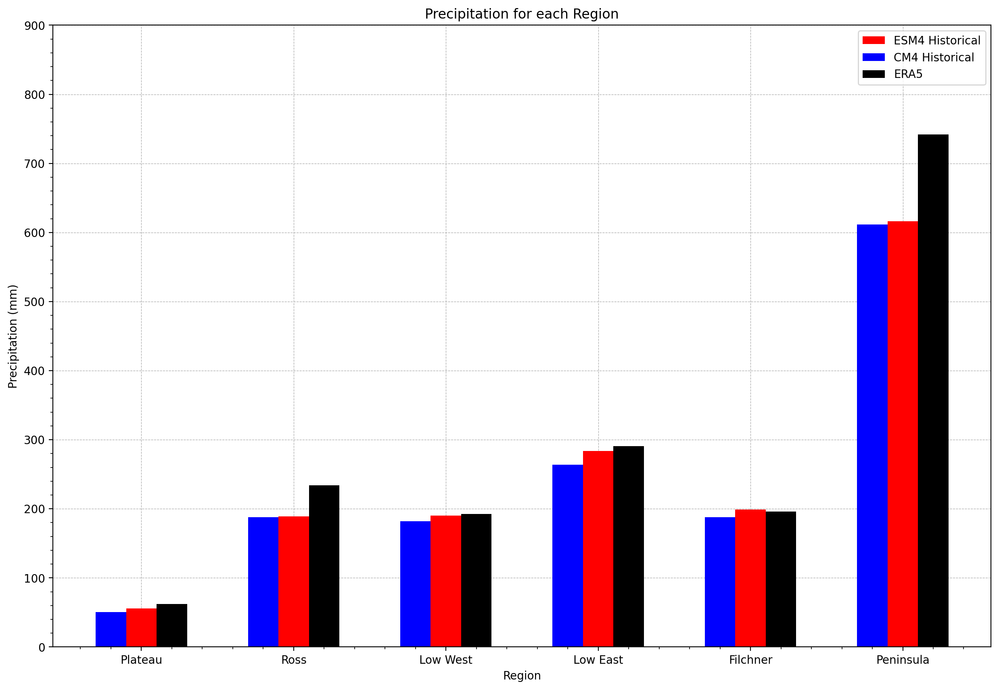

In [124]:

fig, ax= plt.subplots(figsize= (15,10))

X = ['Plateau','Ross','Low West','Low East', 'Filchner', 'Peninsula'] 
CM4_total = [50.45541001527454,
187.70509117894107,
182.13044866570272,
264.12269395950716,
188.11162736528786,
611.2815082306042] 
ESM4_total = [55.80277057742933,
188.74704451445723,
190.2327200223226,
283.9579828432761,
198.89071607758524,
616.3111530477181] 

ERA5_total = [62.39680100043188,
234.10986027738545,
192.50617053330643,
290.77986885386053,
195.98141819005832,
741.9004318944644]
  
X_axis = np.arange(len(X)) 
plt.bar(X_axis, ESM4_total, 0.2, label = 'ESM4 Historical', color='r') 
plt.bar(X_axis - 0.2, CM4_total, 0.2, label = 'CM4 Historical', color= 'blue') 
plt.bar(X_axis + 0.2, ERA5_total, 0.2, label= 'ERA5', color= 'k')
ax.grid(linewidth=0.5, linestyle= '--')
ax.set_axisbelow(True)
plt.xticks(X_axis, X) 
plt.xlabel("Region") 
plt.ylabel("Precipitation (mm)" )
plt.title("Precipitation for each Region") 
plt.legend() 
ax.minorticks_on()
plt.ylim(0,900)


In [41]:
plat_value_CM4_summer=print(plateau_precip_summer_CM4.values)
ross_value_CM4_summer= print(ross_precip_summer_CM4.values)
west_value_CM4_summer=print(lowwest_precip_summer_CM4.values)
east_value_CM4_summer=print(loweast_precip_summer_CM4.values)
filch_value_CM4_summer=print(filchner_precip_summer_CM4.values)
pen_value_CM4_summer=print(peninsula_precip_summer_CM4.values)

11.055880502681248
50.21406218293123
41.95718321716413
58.65743941103574
33.564181489055045
89.39052911591716


In [42]:
plat_value_ESM4_summer=print(plateau_precip_summer_ESM4.values)
ross_value_ESM4_summer= print(ross_precip_summer_ESM4.values)
west_value_ESM4_summer=print(lowwest_precip_summer_ESM4.values)
east_value_ESM4_summer=print(loweast_precip_summer_ESM4.values)
filch_value_ESM4_summer=print(filchner_precip_summer_ESM4.values)
pen_value_ESM4_summer=print(peninsula_precip_summer_ESM4.values)

12.539425009890692
48.938751555397175
41.78593975666445
60.1593655301258
33.33305391424801
93.31503728753887


In [43]:
plat_value_ERA5_summer=print(plateau_precip_summer_ERA5.values)
ross_value_ERA5_summer= print(ross_precip_summer_ERA5.values)
west_value_ERA5_summer=print(lowwest_precip_summer_ERA5.values)
east_value_ERA5_summer=print(loweast_precip_summer_ERA5.values)
filch_value_ERA5_summer=print(filchner_precip_summer_ERA5.values)
pen_value_ERA5_summer=print(peninsula_precip_summer_ERA5.values)

11.804964116890915
45.126465542125516
35.33478519238997
62.02709217905067
41.39255752670579
126.93997984752059


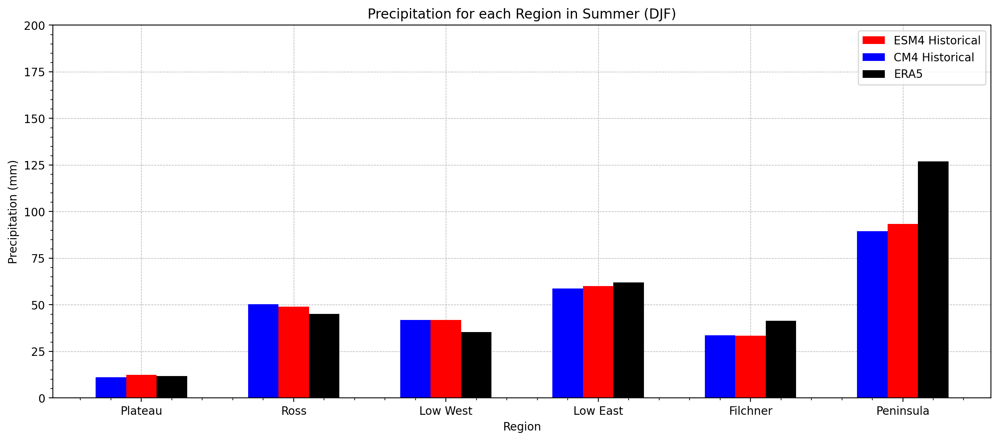

In [123]:

fig, ax= plt.subplots(figsize= (15,6))


X = ['Plateau','Ross','Low West','Low East', 'Filchner', 'Peninsula'] 
CM4_summer = [11.055880502681248,
50.21406218293123,
41.95718321716413,
58.65743941103574,
33.564181489055045,
89.39052911591716


] 
ESM4_summer = [12.539425009890692,
48.938751555397175,
41.78593975666445,
60.1593655301258,
33.33305391424801,
93.31503728753887
] 

ERA5_summer = [11.804964116890915,
45.126465542125516,
35.33478519238997,
62.02709217905067,
41.39255752670579,
126.93997984752059
       ]
X_axis = np.arange(len(X)) 
  
plt.bar(X_axis, ESM4_summer, 0.2, label = 'ESM4 Historical', color='r') 
plt.bar(X_axis - 0.2, CM4_summer, 0.2, label = 'CM4 Historical', color= 'blue') 
plt.bar(X_axis + 0.2, ERA5_summer, 0.2, label= 'ERA5', color= 'k')
ax.grid(linewidth=0.5, linestyle= '--')
ax.set_axisbelow(True)
plt.xticks(X_axis, X) 
plt.xlabel("Region") 
plt.ylabel("Precipitation (mm)") 
plt.title("Precipitation for each Region in Summer (DJF)") 
plt.legend() 
ax.minorticks_on()
plt.ylim(0,200)
plt.show() 








In [45]:
plat_value_CM4_winter=print(plateau_precip_winter_CM4.values)
ross_value_CM4_winter= print(ross_precip_winter_CM4.values)
west_value_CM4_winter=print(lowwest_precip_winter_CM4.values)
east_value_CM4_winter=print(loweast_precip_winter_CM4.values)
filch_value_CM4_winter=print(filchner_precip_winter_CM4.values)
pen_value_CM4_winter=print(peninsula_precip_winter_CM4.values)

12.25662989745615
37.824519647983834
44.0848654252477
72.71180259995162
52.637792215682566
182.69768259488046


In [46]:
plat_value_ESM4_winter=print(plateau_precip_winter_ESM4.values)
ross_value_ESM4_winter= print(ross_precip_winter_ESM4.values)
west_value_ESM4_winter=print(lowwest_precip_winter_ESM4.values)
east_value_ESM4_winter=print(loweast_precip_winter_ESM4.values)
filch_value_ESM4_winter=print(filchner_precip_winter_ESM4.values)
pen_value_ESM4_winter=print(peninsula_precip_winter_ESM4.values)

13.398239373054821
39.32831982965581
46.96325487457216
79.8522797995247
54.45376113639213
181.13941617775708


In [47]:
plat_value_ERA5_winter=print(plateau_precip_winter_ERA5.values)
ross_value_ERA5_winter= print(ross_precip_winter_ERA5.values)
west_value_ERA5_winter=print(lowwest_precip_winter_ERA5.values)
east_value_ERA5_winter=print(loweast_precip_winter_ERA5.values)
filch_value_ERA5_winter=print(filchner_precip_winter_ERA5.values)
pen_value_ERA5_winter=print(peninsula_precip_winter_ERA5.values)

15.801985835423693
65.77070478815585
51.683642668649554
83.91112043755129
49.378193338634446
205.07593138609082


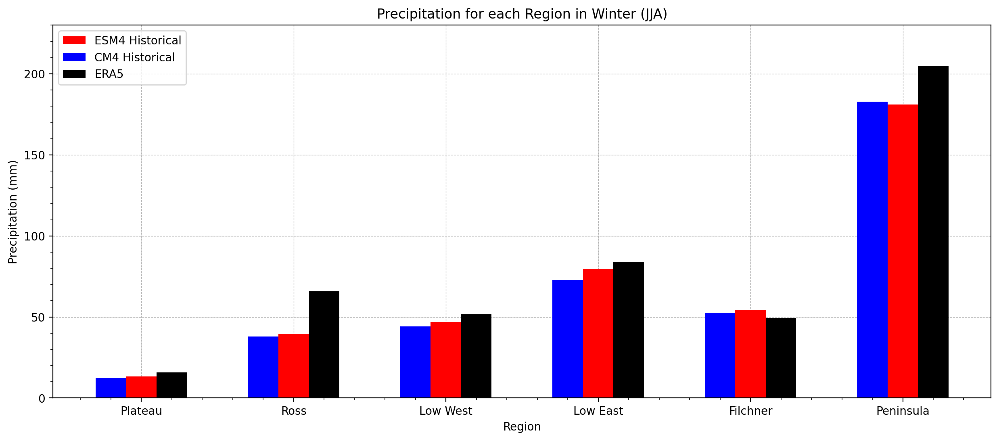

In [122]:

fig, ax= plt.subplots(figsize= (15,6))


X = ['Plateau','Ross','Low West','Low East', 'Filchner', 'Peninsula'] 
CM4_winter = [12.25662989745615,
37.824519647983834,
44.0848654252477,
72.71180259995162,
52.637792215682566,
182.69768259488046


] 
ESM4_winter = [13.398239373054821,
39.32831982965581,
46.96325487457216,
79.8522797995247,
54.45376113639213,
181.13941617775708
] 

ERA5_winter = [15.801985835423693,
65.77070478815585,
51.683642668649554,
83.91112043755129,
49.378193338634446,
205.07593138609082]
X_axis = np.arange(len(X)) 
  
plt.bar(X_axis, ESM4_winter, 0.2, label = 'ESM4 Historical', color='red') 
plt.bar(X_axis - 0.2, CM4_winter, 0.2, label = 'CM4 Historical', color= 'blue') 
plt.bar(X_axis + 0.2, ERA5_winter, 0.2, label= 'ERA5', color= 'k')
ax.grid(linewidth=0.5, linestyle= '--')
ax.set_axisbelow(True)
plt.xticks(X_axis, X) 
plt.xlabel("Region") 
plt.ylabel("Precipitation (mm)") 
plt.title("Precipitation for each Region in Winter (JJA)") 
plt.legend() 
ax.minorticks_on()
plt.ylim(0,230)
plt.show() 





In [49]:
plat_value_CM4_spring=print(plateau_precip_spring_CM4.values)
ross_value_CM4_spring= print(ross_precip_spring_CM4.values)
west_value_CM4_spring=print(lowwest_precip_spring_CM4.values)
east_value_CM4_spring=print(loweast_precip_spring_CM4.values)
filch_value_CM4_spring=print(filchner_precip_spring_CM4.values)
pen_value_CM4_spring=print(peninsula_precip_spring_CM4.values)

11.472707767097745
36.11959088011645
41.14573513943469
54.139699318329804
53.143308869039174
176.88120589591563


In [50]:
plat_value_ESM4_spring=print(plateau_precip_spring_ESM4.values)
ross_value_ESM4_spring= print(ross_precip_spring_ESM4.values)
west_value_ESM4_springr=print(lowwest_precip_spring_ESM4.values)
east_value_ESM4_spring=print(loweast_precip_spring_ESM4.values)
filch_value_ESM4_spring=print(filchner_precip_spring_ESM4.values)
pen_value_ESM4_spring=print(peninsula_precip_spring_ESM4.values)

12.587091963359853
37.13204920204589
43.938523760880344
60.43083994591143
58.05904460430611
177.45512999827042


In [51]:
plat_value_ERA5_spring=print(plateau_precip_spring_ERA5.values)
ross_value_ERA5_spring= print(ross_precip_spring_ERA5.values)
west_value_ERA5_springr=print(lowwest_precip_spring_ERA5.values)
east_value_ERA5_spring=print(loweast_precip_spring_ERA5.values)
filch_value_ERA5_spring=print(filchner_precip_spring_ERA5.values)
pen_value_ERA5_spring=print(peninsula_precip_spring_ERA5.values)

15.653458105225582
51.91022299550241
48.554111349221785
62.489336798898876
53.83529286336852
202.03858899185434


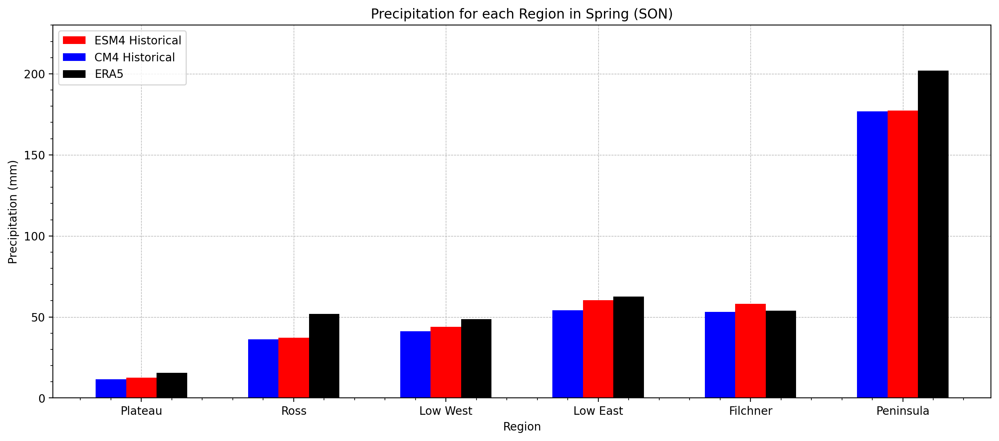

In [121]:

fig, ax= plt.subplots(figsize= (15,6))


X = ['Plateau','Ross','Low West','Low East', 'Filchner', 'Peninsula'] 
CM4_spring = [11.472707767097745,
36.11959088011645,
41.14573513943469,
54.139699318329804,
53.143308869039174,
176.88120589591563
] 
ESM4_spring = [12.587091963359853,
37.13204920204589,
43.938523760880344,
60.43083994591143,
58.05904460430611,
177.45512999827042
] 

ERA5_spring = [15.653458105225582,
51.91022299550241,
48.554111349221785,
62.489336798898876,
53.83529286336852,
202.03858899185434
]
X_axis = np.arange(len(X)) 
  
plt.bar(X_axis, ESM4_spring, 0.2, label = 'ESM4 Historical', color='r') 
plt.bar(X_axis - 0.2, CM4_spring, 0.2, label = 'CM4 Historical', color= 'blue') 
plt.bar(X_axis + 0.2, ERA5_spring, 0.2, label= 'ERA5', color= 'k')
ax.grid(linewidth=0.5, linestyle= '--')
ax.set_axisbelow(True)
plt.xticks(X_axis, X) 
plt.xlabel("Region") 
plt.ylabel("Precipitation (mm)") 
plt.title("Precipitation for each Region in Spring (SON)") 
plt.legend() 
ax.minorticks_on()
plt.ylim(0,230)
plt.show() 





In [53]:
plat_value_CM4_fall=print(plateau_precip_fall_CM4.values)
ross_value_CM4_fall= print(ross_precip_fall_CM4.values)
west_value_CM4_fall=print(lowwest_precip_fall_CM4.values)
east_value_CM4_fall=print(loweast_precip_fall_CM4.values)
filch_value_CM4_fall=print(filchner_precip_fall_CM4.values)
pen_value_CM4_fall=print(peninsula_precip_fall_CM4.values)

15.713132999371737
63.57690979493782
55.0550946907606
78.88616560958326
48.982586577767506
163.4061815449968


In [54]:
plat_value_ESM4_fall=print(plateau_precip_fall_ESM4.values)
ross_value_ESM4_fall= print(ross_precip_fall_ESM4.values)
west_value_ESM4_fallr=print(lowwest_precip_fall_ESM4.values)
east_value_ESM4_fall=print(loweast_precip_fall_ESM4.values)
filch_value_ESM4_fall=print(filchner_precip_fall_ESM4.values)
pen_value_ESM4_fall=print(peninsula_precip_fall_ESM4.values)

17.319700788357295
63.403708033729345
57.697137258946896
83.84847776032984
53.300835855770856
165.4434529831633


In [55]:
plat_value_ERA5_fall=print(plateau_precip_fall_ERA5.values)
ross_value_ERA5_fall= print(ross_precip_fall_ERA5.values)
west_value_ERA5_fall=print(lowwest_precip_fall_ERA5.values)
east_value_ERA5_fall=print(loweast_precip_fall_ERA5.values)
filch_value_ERA5_fall=print(filchner_precip_fall_ERA5.values)
pen_value_ERA5_fall=print(peninsula_precip_fall_ERA5.values)

19.214896610355936
71.65341968648136
57.197091093985364
82.67725127516314
51.4747494016774
208.9026507223025


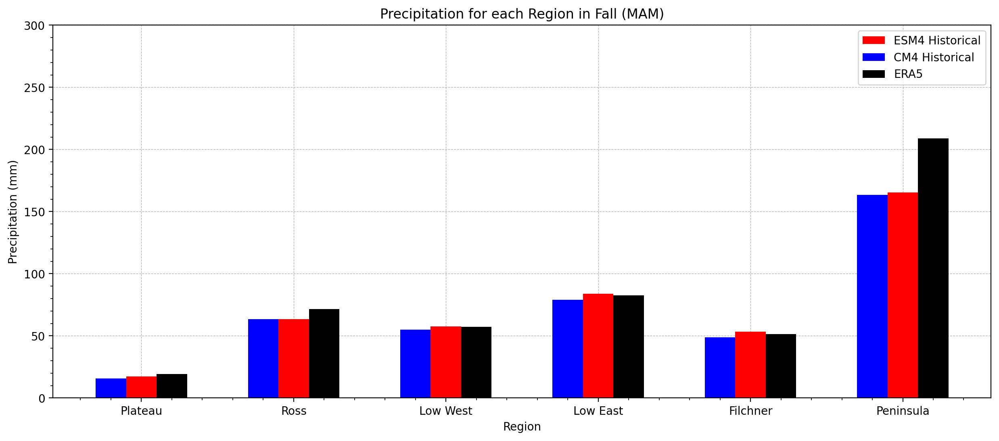

In [125]:

fig, ax= plt.subplots(figsize= (15,6))


X = ['Plateau','Ross','Low West','Low East', 'Filchner', 'Peninsula'] 
CM4_fall = [15.713132999371737,
63.57690979493782,
55.0550946907606,
78.88616560958326,
48.982586577767506,
163.4061815449968

] 
ESM4_fall = [17.319700788357295,
63.403708033729345,
57.697137258946896,
83.84847776032984,
53.300835855770856,
165.4434529831633
] 

ERA5_fall = [19.214896610355936,
71.65341968648136,
57.197091093985364,
82.67725127516314,
51.4747494016774,
208.9026507223025
]
X_axis = np.arange(len(X)) 
  
plt.bar(X_axis, ESM4_fall, 0.2, label = 'ESM4 Historical', color='red') 
plt.bar(X_axis - 0.2, CM4_fall, 0.2, label = 'CM4 Historical', color= 'blue') 
plt.bar(X_axis + 0.2, ERA5_fall, 0.2, label= 'ERA5', color= 'k')
ax.grid(linewidth=0.5, linestyle= '--')
ax.set_axisbelow(True)
plt.xticks(X_axis, X) 
plt.xlabel("Region") 
plt.ylabel("Precipitation (mm)") 
plt.title("Precipitation for each Region in Fall (MAM)") 
plt.legend() 
ax.minorticks_on()
plt.ylim(0,300)
plt.show() 





# <span style="color:red">1995-2014</span>

In [21]:
#selecting precip variable
ESM4_historical_prsn_95= precip_esm4.prsn.sel(time=slice('1995-01-01','2014-12-01'))
CM4_historical_prsn_95=precip_cm4.prsn.sel(time=slice('1995-01-01','2014-12-01'))

In [22]:
#meaning number to remove the dimension and slicing time as historical
ERA5_snowfall_amount_95= ERA5_combine.mean('number').sel(time=slice('1995-01-01','2014-12-01'))

In [23]:
precip_seasonal_CM4_95 = CM4_historical_prsn_95.groupby('time.season').mean(dim='time')
precip_summer_CM4_95= precip_seasonal_CM4_95.sel(season= 'DJF')
precip_winter_CM4_95=precip_seasonal_CM4_95.sel(season='JJA')
precip_spring_CM4_95=precip_seasonal_CM4_95.sel(season='SON')
precip_fall_CM4_95=precip_seasonal_CM4_95.sel(season='MAM')

In [24]:
precip_seasonal_ESM4_95 = ESM4_historical_prsn_95.groupby('time.season').mean(dim='time')
precip_summer_ESM4_95= precip_seasonal_ESM4_95.sel(season= 'DJF')
precip_winter_ESM4_95=precip_seasonal_ESM4_95.sel(season='JJA')
precip_spring_ESM4_95=precip_seasonal_ESM4_95.sel(season='SON')
precip_fall_ESM4_95=precip_seasonal_ESM4_95.sel(season='MAM')

In [25]:
precip_seasonal_ERA5_95 = ERA5_snowfall_amount_95.groupby('time.season').mean(dim='time')
precip_summer_ERA5_95= precip_seasonal_ERA5_95.sel(season= 'DJF')
precip_winter_ERA5_95=precip_seasonal_ERA5_95.sel(season='JJA')
precip_spring_ERA5_95=precip_seasonal_ERA5_95.sel(season='SON')
precip_fall_ERA5_95=precip_seasonal_ERA5_95.sel(season='MAM')

In [26]:
precip_total_CM4_95=CM4_historical_prsn_95.mean('time')
precip_total_ESM4_95=ESM4_historical_prsn_95.mean('time')
precip_total_ERA5_95=ERA5_snowfall_amount_95.mean('time')

In [27]:

plateau_precip_CM4_bar_95=((precip_total_CM4_95*(mask_CM4.plateau_CM4)).mean('lat').mean('lon'))*(ann_sec)
ross_precip_CM4_bar_95=((precip_total_CM4_95*(mask_CM4.ross_CM4)).mean('lat').mean('lon'))*(ann_sec)
lowwest_precip_CM4_bar_95=((precip_total_CM4_95*(mask_CM4.lowwest_CM4)).mean('lat').mean('lon'))*(ann_sec)
loweast_precip_CM4_bar_95=((precip_total_CM4_95*(mask_CM4.loweast_CM4)).mean('lat').mean('lon'))*(ann_sec)
filchner_precip_CM4_bar_95=((precip_total_CM4_95*(mask_CM4.filchner_CM4)).mean('lat').mean('lon'))*(ann_sec)
peninsula_precip_CM4_bar_95=((precip_total_CM4_95*(mask_CM4.peninsula_CM4)).mean('lat').mean('lon'))*(ann_sec)

plateau_precip_ESM4_bar_95=((precip_total_ESM4_95*(mask_ESM4.plateau_ESM4)).mean('lat').mean('lon'))*(ann_sec)
ross_precip_ESM4_bar_95=(precip_total_ESM4_95*(mask_ESM4.ross_ESM4)).mean('lat').mean('lon')*(ann_sec)
lowwest_precip_ESM4_bar_95=(precip_total_ESM4_95*(mask_ESM4.lowwest_ESM4)).mean('lat').mean('lon')*(ann_sec)
loweast_precip_ESM4_bar_95=(precip_total_ESM4_95*(mask_ESM4.loweast_ESM4)).mean('lat').mean('lon')*(ann_sec)
filchner_precip_ESM4_bar_95=(precip_total_ESM4_95*(mask_ESM4.filchner_ESM4)).mean('lat').mean('lon')*(ann_sec)
peninsula_precip_ESM4_bar_95=(precip_total_ESM4_95*(mask_ESM4.peninsula_ESM4)).mean('lat').mean('lon')*(ann_sec)

plateau_precip_ERA5_bar_95=((precip_total_ERA5_95*(mask_ERA5.plateau_ERA5)).mean('latitude').mean('longitude'))*(ann_sec)
ross_precip_ERA5_bar_95=(precip_total_ERA5_95*(mask_ERA5.ross_ERA5)).mean('latitude').mean('longitude')*(ann_sec)
lowwest_precip_ERA5_bar_95=(precip_total_ERA5_95*(mask_ERA5.lowwest_ERA5)).mean('latitude').mean('longitude')*(ann_sec)
loweast_precip_ERA5_bar_95=(precip_total_ERA5_95*(mask_ERA5.loweast_ERA5)).mean('latitude').mean('longitude')*(ann_sec)
filchner_precip_ERA5_bar_95=(precip_total_ERA5_95*(mask_ERA5.filchner_ERA5)).mean('latitude').mean('longitude')*(ann_sec)
peninsula_precip_ERA5_bar_95=(precip_total_ERA5_95*(mask_ERA5.peninsula_ERA5)).mean('latitude').mean('longitude')*(ann_sec)

In [28]:
plateau_precip_summer_CM4_95=(precip_summer_CM4_95*(mask_CM4.plateau_CM4)).mean('lat').mean('lon')*DJF_sec
ross_precip_summer_CM4_95=(precip_summer_CM4_95*(mask_CM4.ross_CM4)).mean('lat').mean('lon')*DJF_sec
lowwest_precip_summer_CM4_95=(precip_summer_CM4_95*(mask_CM4.lowwest_CM4)).mean('lat').mean('lon')*DJF_sec
loweast_precip_summer_CM4_95=(precip_summer_CM4_95*(mask_CM4.loweast_CM4)).mean('lat').mean('lon')*DJF_sec
filchner_precip_summer_CM4_95=(precip_summer_CM4_95*(mask_CM4.filchner_CM4)).mean('lat').mean('lon')*DJF_sec
peninsula_precip_summer_CM4_95=(precip_summer_CM4_95*(mask_CM4.peninsula_CM4)).mean('lat').mean('lon')*DJF_sec

plateau_precip_summer_ESM4_95=(precip_summer_ESM4_95*(mask_ESM4.plateau_ESM4)).mean('lat').mean('lon')*DJF_sec
ross_precip_summer_ESM4_95=(precip_summer_ESM4_95*(mask_ESM4.ross_ESM4)).mean('lat').mean('lon')*DJF_sec
lowwest_precip_summer_ESM4_95=(precip_summer_ESM4_95*(mask_ESM4.lowwest_ESM4)).mean('lat').mean('lon')*DJF_sec
loweast_precip_summer_ESM4_95=(precip_summer_ESM4_95*(mask_ESM4.loweast_ESM4)).mean('lat').mean('lon')*DJF_sec
filchner_precip_summer_ESM4_95=(precip_summer_ESM4_95*(mask_ESM4.filchner_ESM4)).mean('lat').mean('lon')*DJF_sec
peninsula_precip_summer_ESM4_95=(precip_summer_ESM4_95*(mask_ESM4.peninsula_ESM4)).mean('lat').mean('lon')*DJF_sec

plateau_precip_summer_ERA5_95=(precip_summer_ERA5_95*(mask_ERA5.plateau_ERA5)).mean('latitude').mean('longitude')*DJF_sec
ross_precip_summer_ERA5_95=(precip_summer_ERA5_95*(mask_ERA5.ross_ERA5)).mean('latitude').mean('longitude')*DJF_sec
lowwest_precip_summer_ERA5_95=(precip_summer_ERA5_95*(mask_ERA5.lowwest_ERA5)).mean('latitude').mean('longitude')*DJF_sec
loweast_precip_summer_ERA5_95=(precip_summer_ERA5_95*(mask_ERA5.loweast_ERA5)).mean('latitude').mean('longitude')*DJF_sec
filchner_precip_summer_ERA5_95=(precip_summer_ERA5_95*(mask_ERA5.filchner_ERA5)).mean('latitude').mean('longitude')*DJF_sec
peninsula_precip_summer_ERA5_95=(precip_summer_ERA5_95*(mask_ERA5.peninsula_ERA5)).mean('latitude').mean('longitude')*DJF_sec

In [29]:
plateau_precip_winter_CM4_95=(precip_winter_CM4_95*(mask_CM4.plateau_CM4)).mean('lat').mean('lon')*JJA_sec
ross_precip_winter_CM4_95=(precip_winter_CM4_95*(mask_CM4.ross_CM4)).mean('lat').mean('lon')*JJA_sec
lowwest_precip_winter_CM4_95=(precip_winter_CM4_95*(mask_CM4.lowwest_CM4)).mean('lat').mean('lon')*JJA_sec
loweast_precip_winter_CM4_95=(precip_winter_CM4_95*(mask_CM4.loweast_CM4)).mean('lat').mean('lon')*JJA_sec
filchner_precip_winter_CM4_95=(precip_winter_CM4_95*(mask_CM4.filchner_CM4)).mean('lat').mean('lon')*JJA_sec
peninsula_precip_winter_CM4_95=(precip_winter_CM4_95*(mask_CM4.peninsula_CM4)).mean('lat').mean('lon')*JJA_sec

plateau_precip_winter_ESM4_95=(precip_winter_ESM4_95*(mask_ESM4.plateau_ESM4)).mean('lat').mean('lon')*JJA_sec
ross_precip_winter_ESM4_95=(precip_winter_ESM4_95*(mask_ESM4.ross_ESM4)).mean('lat').mean('lon')*JJA_sec
lowwest_precip_winter_ESM4_95=(precip_winter_ESM4_95*(mask_ESM4.lowwest_ESM4)).mean('lat').mean('lon')*JJA_sec
loweast_precip_winter_ESM4_95=(precip_winter_ESM4_95*(mask_ESM4.loweast_ESM4)).mean('lat').mean('lon')*JJA_sec
filchner_precip_winter_ESM4_95=(precip_winter_ESM4_95*(mask_ESM4.filchner_ESM4)).mean('lat').mean('lon')*JJA_sec
peninsula_precip_winter_ESM4_95=(precip_winter_ESM4_95*(mask_ESM4.peninsula_ESM4)).mean('lat').mean('lon')*JJA_sec

plateau_precip_winter_ERA5_95=(precip_winter_ERA5_95*(mask_ERA5.plateau_ERA5)).mean('latitude').mean('longitude')*JJA_sec
ross_precip_winter_ERA5_95=(precip_winter_ERA5_95*(mask_ERA5.ross_ERA5)).mean('latitude').mean('longitude')*JJA_sec
lowwest_precip_winter_ERA5_95=(precip_winter_ERA5_95*(mask_ERA5.lowwest_ERA5)).mean('latitude').mean('longitude')*JJA_sec
loweast_precip_winter_ERA5_95=(precip_winter_ERA5_95*(mask_ERA5.loweast_ERA5)).mean('latitude').mean('longitude')*JJA_sec
filchner_precip_winter_ERA5_95=(precip_winter_ERA5_95*(mask_ERA5.filchner_ERA5)).mean('latitude').mean('longitude')*JJA_sec
peninsula_precip_winter_ERA5_95=(precip_winter_ERA5_95*(mask_ERA5.peninsula_ERA5)).mean('latitude').mean('longitude')*JJA_sec

In [30]:
plateau_precip_spring_CM4_95=(precip_spring_CM4_95*(mask_CM4.plateau_CM4)).mean('lat').mean('lon')*SON_sec
ross_precip_spring_CM4_95=(precip_spring_CM4_95*(mask_CM4.ross_CM4)).mean('lat').mean('lon')*SON_sec
lowwest_precip_spring_CM4_95=(precip_spring_CM4_95*(mask_CM4.lowwest_CM4)).mean('lat').mean('lon')*SON_sec
loweast_precip_spring_CM4_95=(precip_spring_CM4_95*(mask_CM4.loweast_CM4)).mean('lat').mean('lon')*SON_sec
filchner_precip_spring_CM4_95=(precip_spring_CM4_95*(mask_CM4.filchner_CM4)).mean('lat').mean('lon')*SON_sec
peninsula_precip_spring_CM4_95=(precip_spring_CM4_95*(mask_CM4.peninsula_CM4)).mean('lat').mean('lon')*SON_sec

plateau_precip_spring_ESM4_95=(precip_spring_ESM4_95*(mask_ESM4.plateau_ESM4)).mean('lat').mean('lon')*SON_sec
ross_precip_spring_ESM4_95=(precip_spring_ESM4_95*(mask_ESM4.ross_ESM4)).mean('lat').mean('lon')*SON_sec
lowwest_precip_spring_ESM4_95=(precip_spring_ESM4_95*(mask_ESM4.lowwest_ESM4)).mean('lat').mean('lon')*SON_sec
loweast_precip_spring_ESM4_95=(precip_spring_ESM4_95*(mask_ESM4.loweast_ESM4)).mean('lat').mean('lon')*SON_sec
filchner_precip_spring_ESM4_95=(precip_spring_ESM4_95*(mask_ESM4.filchner_ESM4)).mean('lat').mean('lon')*SON_sec
peninsula_precip_spring_ESM4_95=(precip_spring_ESM4_95*(mask_ESM4.peninsula_ESM4)).mean('lat').mean('lon')*SON_sec

plateau_precip_spring_ERA5_95=(precip_spring_ERA5_95*(mask_ERA5.plateau_ERA5)).mean('latitude').mean('longitude')*SON_sec
ross_precip_spring_ERA5_95=(precip_spring_ERA5_95*(mask_ERA5.ross_ERA5)).mean('latitude').mean('longitude')*SON_sec
lowwest_precip_spring_ERA5_95=(precip_spring_ERA5_95*(mask_ERA5.lowwest_ERA5)).mean('latitude').mean('longitude')*SON_sec
loweast_precip_spring_ERA5_95=(precip_spring_ERA5_95*(mask_ERA5.loweast_ERA5)).mean('latitude').mean('longitude')*SON_sec
filchner_precip_spring_ERA5_95=(precip_spring_ERA5_95*(mask_ERA5.filchner_ERA5)).mean('latitude').mean('longitude')*SON_sec
peninsula_precip_spring_ERA5_95=(precip_spring_ERA5_95*(mask_ERA5.peninsula_ERA5)).mean('latitude').mean('longitude')*SON_sec

In [31]:
plateau_precip_fall_CM4_95=(precip_fall_CM4_95*(mask_CM4.plateau_CM4)).mean('lat').mean('lon')*MAM_sec
ross_precip_fall_CM4_95=(precip_fall_CM4_95*(mask_CM4.ross_CM4)).mean('lat').mean('lon')*MAM_sec
lowwest_precip_fall_CM4_95=(precip_fall_CM4_95*(mask_CM4.lowwest_CM4)).mean('lat').mean('lon')*MAM_sec
loweast_precip_fall_CM4_95=(precip_fall_CM4_95*(mask_CM4.loweast_CM4)).mean('lat').mean('lon')*MAM_sec
filchner_precip_fall_CM4_95=(precip_fall_CM4_95*(mask_CM4.filchner_CM4)).mean('lat').mean('lon')*MAM_sec
peninsula_precip_fall_CM4_95=(precip_fall_CM4_95*(mask_CM4.peninsula_CM4)).mean('lat').mean('lon')*MAM_sec

plateau_precip_fall_ESM4_95=(precip_fall_ESM4_95*(mask_ESM4.plateau_ESM4)).mean('lat').mean('lon')*MAM_sec
ross_precip_fall_ESM4_95=(precip_fall_ESM4_95*(mask_ESM4.ross_ESM4)).mean('lat').mean('lon')*MAM_sec
lowwest_precip_fall_ESM4_95=(precip_fall_ESM4_95*(mask_ESM4.lowwest_ESM4)).mean('lat').mean('lon')*MAM_sec
loweast_precip_fall_ESM4_95=(precip_fall_ESM4_95*(mask_ESM4.loweast_ESM4)).mean('lat').mean('lon')*MAM_sec
filchner_precip_fall_ESM4_95=(precip_fall_ESM4_95*(mask_ESM4.filchner_ESM4)).mean('lat').mean('lon')*MAM_sec
peninsula_precip_fall_ESM4_95=(precip_fall_ESM4_95*(mask_ESM4.peninsula_ESM4)).mean('lat').mean('lon')*MAM_sec

plateau_precip_fall_ERA5_95=(precip_fall_ERA5_95*(mask_ERA5.plateau_ERA5)).mean('latitude').mean('longitude')*MAM_sec
ross_precip_fall_ERA5_95=(precip_fall_ERA5_95*(mask_ERA5.ross_ERA5)).mean('latitude').mean('longitude')*MAM_sec
lowwest_precip_fall_ERA5_95=(precip_fall_ERA5_95*(mask_ERA5.lowwest_ERA5)).mean('latitude').mean('longitude')*MAM_sec
loweast_precip_fall_ERA5_95=(precip_fall_ERA5_95*(mask_ERA5.loweast_ERA5)).mean('latitude').mean('longitude')*MAM_sec
filchner_precip_fall_ERA5_95=(precip_fall_ERA5_95*(mask_ERA5.filchner_ERA5)).mean('latitude').mean('longitude')*MAM_sec
peninsula_precip_fall_ERA5_95=(precip_fall_ERA5_95*(mask_ERA5.peninsula_ERA5)).mean('latitude').mean('longitude')*MAM_sec

In [32]:
plateau_precip_CM4_spatial_95=((precip_total_CM4_95*(mask_CM4.plateau_CM4)*(ann_sec)))
ross_precip_CM4_spatial_95=((precip_total_CM4_95*(mask_CM4.ross_CM4))*(ann_sec))
lowwest_precip_CM4_spatial_95=((precip_total_CM4_95*(mask_CM4.lowwest_CM4))*(ann_sec))
loweast_precip_CM4_spatial_95=((precip_total_CM4_95*(mask_CM4.loweast_CM4))*(ann_sec))
filchner_precip_CM4_spatial_95=((precip_total_CM4_95*(mask_CM4.filchner_CM4))*(ann_sec))
peninsula_precip_CM4_spatial_95=((precip_total_CM4_95*(mask_CM4.peninsula_CM4))*(ann_sec))

plateau_precip_ESM4_spatial_95=((precip_total_ESM4_95*(mask_ESM4.plateau_ESM4))*(ann_sec))
ross_precip_ESM4_spatial_95=(precip_total_ESM4_95*(mask_ESM4.ross_ESM4))*(ann_sec)
lowwest_precip_ESM4_spatial_95=(precip_total_ESM4_95*(mask_ESM4.lowwest_ESM4))*(ann_sec)
loweast_precip_ESM4_spatial_95=(precip_total_ESM4_95*(mask_ESM4.loweast_ESM4))*(ann_sec)
filchner_precip_ESM4_spatial_95=(precip_total_ESM4_95*(mask_ESM4.filchner_ESM4))*(ann_sec)
peninsula_precip_ESM4_spatial_95=(precip_total_ESM4_95*(mask_ESM4.peninsula_ESM4))*(ann_sec)

plateau_precip_ERA5_spatial_95=((precip_total_ERA5_95*(mask_ERA5.plateau_ERA5))*(ann_sec))
ross_precip_ERA5_spatial_95=(precip_total_ERA5_95*(mask_ERA5.ross_ERA5))*(ann_sec)
lowwest_precip_ERA5_spatial_95=(precip_total_ERA5_95*(mask_ERA5.lowwest_ERA5))*(ann_sec)
loweast_precip_ERA5_spatial_95=(precip_total_ERA5_95*(mask_ERA5.loweast_ERA5))*(ann_sec)
filchner_precip_ERA5_spatial_95=(precip_total_ERA5_95*(mask_ERA5.filchner_ERA5))*(ann_sec)
peninsula_precip_ERA5_spatial_95=(precip_total_ERA5_95*(mask_ERA5.peninsula_ERA5))*(ann_sec)

In [33]:
plateau_precip_summer_CM4_spatial_95=(precip_summer_CM4_95*(mask_CM4.plateau_CM4))*DJF_sec
ross_precip_summer_CM4_spatial_95=(precip_summer_CM4_95*(mask_CM4.ross_CM4))*DJF_sec
lowwest_precip_summer_CM4_spatial_95=(precip_summer_CM4_95*(mask_CM4.lowwest_CM4))*DJF_sec
loweast_precip_summer_CM4_spatial_95=(precip_summer_CM4_95*(mask_CM4.loweast_CM4))*DJF_sec
filchner_precip_summer_CM4_spatial_95=(precip_summer_CM4_95*(mask_CM4.filchner_CM4))*DJF_sec
peninsula_precip_summer_CM4_spatial_95=(precip_summer_CM4_95*(mask_CM4.peninsula_CM4))*DJF_sec

plateau_precip_summer_ESM4_spatial_95=(precip_summer_ESM4_95*(mask_ESM4.plateau_ESM4))*DJF_sec
ross_precip_summer_ESM4_spatial_95=(precip_summer_ESM4_95*(mask_ESM4.ross_ESM4))*DJF_sec
lowwest_precip_summer_ESM4_spatial_95=(precip_summer_ESM4_95*(mask_ESM4.lowwest_ESM4))*DJF_sec
loweast_precip_summer_ESM4_spatial_95=(precip_summer_ESM4_95*(mask_ESM4.loweast_ESM4))*DJF_sec
filchner_precip_summer_ESM4_spatial_95=(precip_summer_ESM4_95*(mask_ESM4.filchner_ESM4))*DJF_sec
peninsula_precip_summer_ESM4_spatial_95=(precip_summer_ESM4_95*(mask_ESM4.peninsula_ESM4))*DJF_sec

plateau_precip_summer_ERA5_spatial_95=(precip_summer_ERA5_95*(mask_ERA5.plateau_ERA5))*DJF_sec
ross_precip_summer_ERA5_spatial_95=(precip_summer_ERA5_95*(mask_ERA5.ross_ERA5))*DJF_sec
lowwest_precip_summer_ERA5_spatial_95=(precip_summer_ERA5_95*(mask_ERA5.lowwest_ERA5))*DJF_sec
loweast_precip_summer_ERA5_spatial_95=(precip_summer_ERA5_95*(mask_ERA5.loweast_ERA5))*DJF_sec
filchner_precip_summer_ERA5_spatial_95=(precip_summer_ERA5_95*(mask_ERA5.filchner_ERA5))*DJF_sec
peninsula_precip_summer_ERA5_spatial_95=(precip_summer_ERA5_95*(mask_ERA5.peninsula_ERA5))*DJF_sec

In [34]:
plateau_precip_winter_CM4_spatial_95=(precip_winter_CM4_95*(mask_CM4.plateau_CM4))*JJA_sec
ross_precip_winter_CM4_spatial_95=(precip_winter_CM4_95*(mask_CM4.ross_CM4))*JJA_sec
lowwest_precip_winter_CM4_spatial_95=(precip_winter_CM4_95*(mask_CM4.lowwest_CM4))*JJA_sec
loweast_precip_winter_CM4_spatial_95=(precip_winter_CM4_95*(mask_CM4.loweast_CM4))*JJA_sec
filchner_precip_winter_CM4_spatial_95=(precip_winter_CM4_95*(mask_CM4.filchner_CM4))*JJA_sec
peninsula_precip_winter_CM4_spatial_95=(precip_winter_CM4_95*(mask_CM4.peninsula_CM4))*JJA_sec

plateau_precip_winter_ESM4_spatial_95=(precip_winter_ESM4_95*(mask_ESM4.plateau_ESM4))*JJA_sec
ross_precip_winter_ESM4_spatial_95=(precip_winter_ESM4_95*(mask_ESM4.ross_ESM4))*JJA_sec
lowwest_precip_winter_ESM4_spatial_95=(precip_winter_ESM4_95*(mask_ESM4.lowwest_ESM4))*JJA_sec
loweast_precip_winter_ESM4_spatial_95=(precip_winter_ESM4_95*(mask_ESM4.loweast_ESM4))*JJA_sec
filchner_precip_winter_ESM4_spatial_95=(precip_winter_ESM4_95*(mask_ESM4.filchner_ESM4))*JJA_sec
peninsula_precip_winter_ESM4_spatial_95=(precip_winter_ESM4_95*(mask_ESM4.peninsula_ESM4))*JJA_sec

plateau_precip_winter_ERA5_spatial_95=(precip_winter_ERA5_95*(mask_ERA5.plateau_ERA5))*JJA_sec
ross_precip_winter_ERA5_spatial_95=(precip_winter_ERA5_95*(mask_ERA5.ross_ERA5))*JJA_sec
lowwest_precip_winter_ERA5_spatial_95=(precip_winter_ERA5_95*(mask_ERA5.lowwest_ERA5))*JJA_sec
loweast_precip_winter_ERA5_spatial_95=(precip_winter_ERA5_95*(mask_ERA5.loweast_ERA5))*JJA_sec
filchner_precip_winter_ERA5_spatial_95=(precip_winter_ERA5_95*(mask_ERA5.filchner_ERA5))*JJA_sec
peninsula_precip_winter_ERA5_spatial_95=(precip_winter_ERA5_95*(mask_ERA5.peninsula_ERA5))*JJA_sec

In [35]:
plateau_precip_spring_CM4_spatial_95=(precip_spring_CM4_95*(mask_CM4.plateau_CM4))*SON_sec
ross_precip_spring_CM4_spatial_95=(precip_spring_CM4_95*(mask_CM4.ross_CM4))*SON_sec
lowwest_precip_spring_CM4_spatial_95=(precip_spring_CM4_95*(mask_CM4.lowwest_CM4))*SON_sec
loweast_precip_spring_CM4_spatial_95=(precip_spring_CM4_95*(mask_CM4.loweast_CM4))*SON_sec
filchner_precip_spring_CM4_spatial_95=(precip_spring_CM4_95*(mask_CM4.filchner_CM4))*SON_sec
peninsula_precip_spring_CM4_spatial_95=(precip_spring_CM4_95*(mask_CM4.peninsula_CM4))*SON_sec

plateau_precip_spring_ESM4_spatial_95=(precip_spring_ESM4_95*(mask_ESM4.plateau_ESM4))*SON_sec
ross_precip_spring_ESM4_spatial_95=(precip_spring_ESM4_95*(mask_ESM4.ross_ESM4))*SON_sec
lowwest_precip_spring_ESM4_spatial_95=(precip_spring_ESM4_95*(mask_ESM4.lowwest_ESM4))*SON_sec
loweast_precip_spring_ESM4_spatial_95=(precip_spring_ESM4_95*(mask_ESM4.loweast_ESM4))*SON_sec
filchner_precip_spring_ESM4_spatial_95=(precip_spring_ESM4_95*(mask_ESM4.filchner_ESM4))*SON_sec
peninsula_precip_spring_ESM4_spatial_95=(precip_spring_ESM4_95*(mask_ESM4.peninsula_ESM4))*SON_sec

plateau_precip_spring_ERA5_spatial_95=(precip_spring_ERA5_95*(mask_ERA5.plateau_ERA5))*SON_sec
ross_precip_spring_ERA5_spatial_95=(precip_spring_ERA5_95*(mask_ERA5.ross_ERA5))*SON_sec
lowwest_precip_spring_ERA5_spatial_95=(precip_spring_ERA5_95*(mask_ERA5.lowwest_ERA5))*SON_sec
loweast_precip_spring_ERA5_spatial_95=(precip_spring_ERA5_95*(mask_ERA5.loweast_ERA5))*SON_sec
filchner_precip_spring_ERA5_spatial_95=(precip_spring_ERA5_95*(mask_ERA5.filchner_ERA5))*SON_sec
peninsula_precip_spring_ERA5_spatial_95=(precip_spring_ERA5_95*(mask_ERA5.peninsula_ERA5))*SON_sec

In [36]:
plateau_precip_fall_CM4_spatial_95=(precip_fall_CM4_95*(mask_CM4.plateau_CM4))*MAM_sec
ross_precip_fall_CM4_spatial_95=(precip_fall_CM4_95*(mask_CM4.ross_CM4))*MAM_sec
lowwest_precip_fall_CM4_spatial_95=(precip_fall_CM4_95*(mask_CM4.lowwest_CM4))*MAM_sec
loweast_precip_fall_CM4_spatial_95=(precip_fall_CM4_95*(mask_CM4.loweast_CM4))*MAM_sec
filchner_precip_fall_CM4_spatial_95=(precip_fall_CM4_95*(mask_CM4.filchner_CM4))*MAM_sec
peninsula_precip_fall_CM4_spatial_95=(precip_fall_CM4_95*(mask_CM4.peninsula_CM4))*MAM_sec

plateau_precip_fall_ESM4_spatial_95=(precip_fall_ESM4_95*(mask_ESM4.plateau_ESM4))*MAM_sec
ross_precip_fall_ESM4_spatial_95=(precip_fall_ESM4_95*(mask_ESM4.ross_ESM4))*MAM_sec
lowwest_precip_fall_ESM4_spatial_95=(precip_fall_ESM4_95*(mask_ESM4.lowwest_ESM4))*MAM_sec
loweast_precip_fall_ESM4_spatial_95=(precip_fall_ESM4_95*(mask_ESM4.loweast_ESM4))*MAM_sec
filchner_precip_fall_ESM4_spatial_95=(precip_fall_ESM4_95*(mask_ESM4.filchner_ESM4))*MAM_sec
peninsula_precip_fall_ESM4_spatial_95=(precip_fall_ESM4_95*(mask_ESM4.peninsula_ESM4))*MAM_sec

plateau_precip_fall_ERA5_spatial_95=(precip_fall_ERA5_95*(mask_ERA5.plateau_ERA5))*MAM_sec
ross_precip_fall_ERA5_spatial_95=(precip_fall_ERA5_95*(mask_ERA5.ross_ERA5))*MAM_sec
lowwest_precip_fall_ERA5_spatial_95=(precip_fall_ERA5_95*(mask_ERA5.lowwest_ERA5))*MAM_sec
loweast_precip_fall_ERA5_spatial_95=(precip_fall_ERA5_95*(mask_ERA5.loweast_ERA5))*MAM_sec
filchner_precip_fall_ERA5_spatial_95=(precip_fall_ERA5_95*(mask_ERA5.filchner_ERA5))*MAM_sec
peninsula_precip_fall_ERA5_spatial_95=(precip_fall_ERA5_95*(mask_ERA5.peninsula_ERA5))*MAM_sec

In [37]:
plat_value_CM4_95=print(plateau_precip_CM4_bar_95.values)
ross_value_CM4_95= print(ross_precip_CM4_bar_95.values)
west_value_CM4_95=print(lowwest_precip_CM4_bar_95.values)
east_value_CM4_95=print(loweast_precip_CM4_bar_95.values)
filch_value_CM4_95=print(filchner_precip_CM4_bar_95.values)
pen_value_CM4_95=print(peninsula_precip_CM4_bar_95.values)

54.23620873807522
196.91238720406545
192.87678273394704
284.2724216898205
196.78592903801473
635.2248662151396


In [86]:
plat_value_ESM4_95=print(plateau_precip_ESM4_bar_95.values)
ross_value_ESM4_95= print(ross_precip_ESM4_bar_95.values)
west_value_ESM4_95=print(lowwest_precip_ESM4_bar_95.values)
east_value_ESM4_95=print(loweast_precip_ESM4_bar_95.values)
filch_value_ESM4_95=print(filchner_precip_ESM4_bar_95.values)
pen_value_ESM4_95=print(peninsula_precip_ESM4_bar_95.values)

58.8276705602766
184.76715448923642
193.62834693311015
291.5705694031203
209.3984317034483
623.6588055908214


In [89]:
plat_value_ERA5_95=print(plateau_precip_ERA5_bar_95.values)
ross_value_ERA5_95= print(ross_precip_ERA5_bar_95.values)
west_value_ERA5_95=print(lowwest_precip_ERA5_bar_95.values)
east_value_ERA5_95=print(loweast_precip_ERA5_bar_95.values)
filch_value_ERA5_95=print(filchner_precip_ERA5_bar_95.values)
pen_value_ERA5_95=print(peninsula_precip_ERA5_bar_95.values)

61.74976771217189
222.94642077031313
189.66761636693263
289.47269468335435
195.51516644423828
742.0374736539088


(0.0, 900.0)

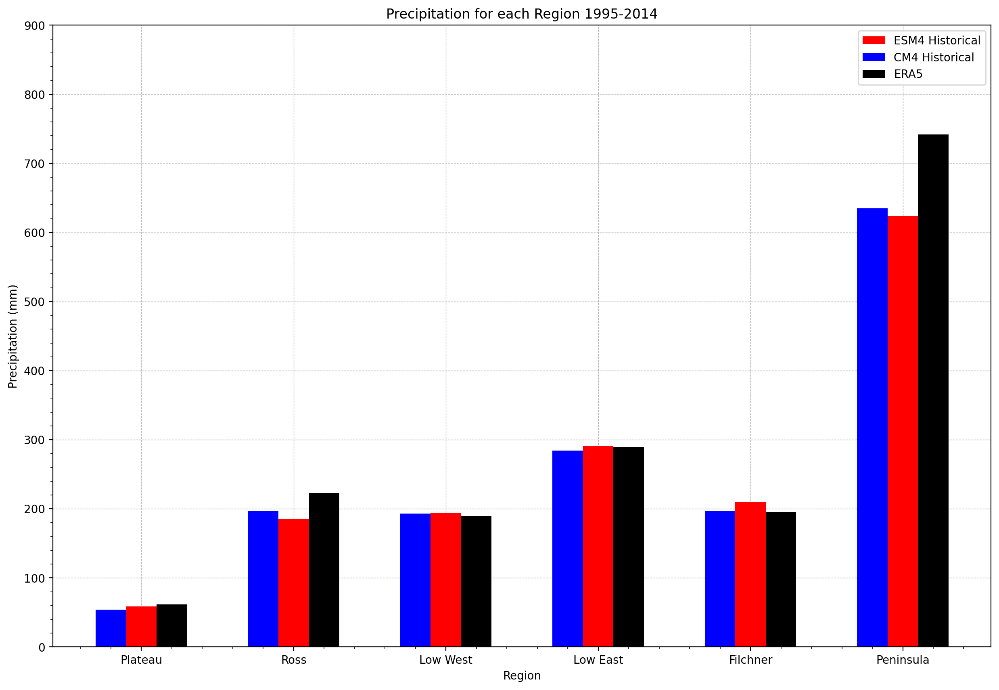

In [126]:

fig, ax= plt.subplots(figsize= (15,10))

X = ['Plateau','Ross','Low West','Low East', 'Filchner', 'Peninsula'] 
CM4_total = [54.23620873807522,
196.91238720406545,
192.87678273394704,
284.2724216898205,
196.78592903801473,
635.2248662151396] 
ESM4_total = [58.8276705602766,
184.76715448923642,
193.62834693311015,
291.5705694031203,
209.3984317034483,
623.6588055908214] 

ERA5_total = [61.74976771217189,
222.94642077031313,
189.66761636693263,
289.47269468335435,
195.51516644423828,
742.0374736539088]
  
X_axis = np.arange(len(X)) 
plt.bar(X_axis, ESM4_total, 0.2, label = 'ESM4 Historical', color='r') 
plt.bar(X_axis - 0.2, CM4_total, 0.2, label = 'CM4 Historical', color= 'blue') 
plt.bar(X_axis + 0.2, ERA5_total, 0.2, label= 'ERA5', color= 'k')
ax.grid(linewidth=0.5, linestyle= '--')
ax.set_axisbelow(True)
plt.xticks(X_axis, X) 
plt.xlabel("Region") 
plt.ylabel("Precipitation (mm)" )
plt.title("Precipitation for each Region 1995-2014") 
plt.legend() 
ax.minorticks_on()
plt.ylim(0,900)


Text(0.5, 0.98, 'Precipitation (mm) 1995-2014')

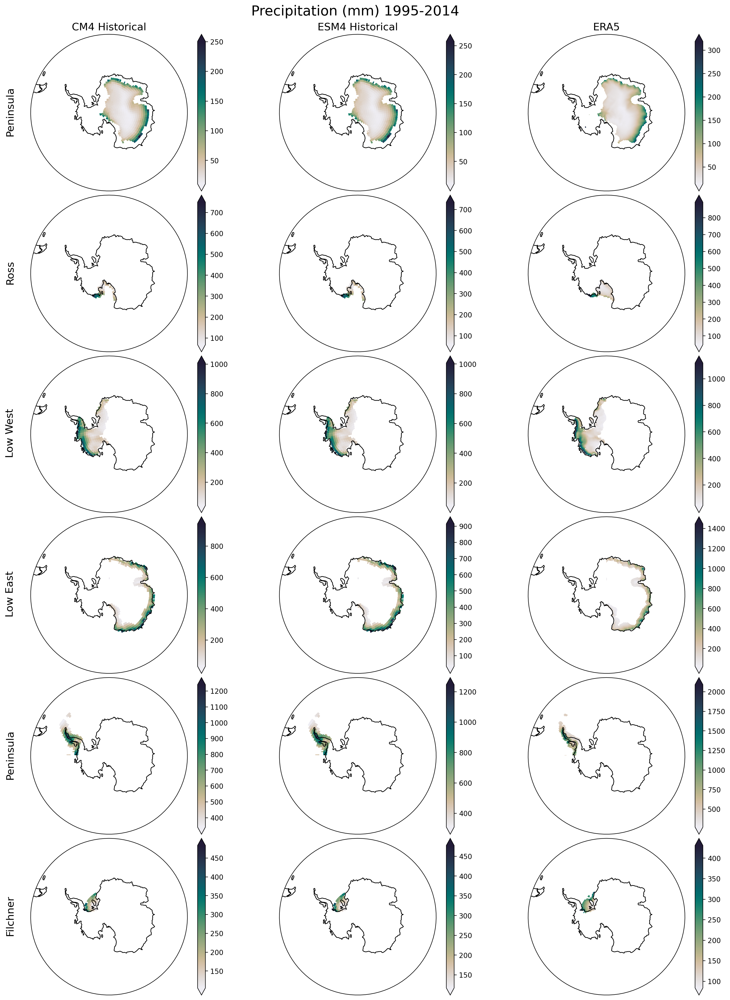

In [52]:
fig, ax = south_pole_map(cols=3, rows=6,fig_size=(15,20))



#CM4 Plots
plateau_precip_CM4_spatial_95.plot(ax=ax[0,0],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.rain)
    
ross_precip_CM4_spatial_95.plot(ax=ax[1,0],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.rain)
lowwest_precip_CM4_spatial_95.plot(ax=ax[2,0],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.rain)
    
loweast_precip_CM4_spatial_95.plot(ax=ax[3,0],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.rain)
peninsula_precip_CM4_spatial_95.plot(ax=ax[4,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
filchner_precip_CM4_spatial_95.plot(ax=ax[5,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
#ESM4 Plots

plateau_precip_ESM4_spatial_95.plot(ax=ax[0,1],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.rain)
    
ross_precip_ESM4_spatial_95.plot(ax=ax[1,1],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.rain)
lowwest_precip_ESM4_spatial_95.plot(ax=ax[2,1],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.rain)
    
loweast_precip_ESM4_spatial_95.plot(ax=ax[3,1],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.rain)
peninsula_precip_ESM4_spatial_95.plot(ax=ax[4,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
filchner_precip_ESM4_spatial_95.plot(ax=ax[5,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)

#ERA5 Plots
plateau_precip_ERA5_spatial_95.plot(ax=ax[0,2],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.rain)
    
ross_precip_ERA5_spatial_95.plot(ax=ax[1,2],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.rain)
lowwest_precip_ERA5_spatial_95.plot(ax=ax[2,2],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.rain)
    
loweast_precip_ERA5_spatial_95.plot(ax=ax[3,2],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.rain)
peninsula_precip_ERA5_spatial_95.plot(ax=ax[4,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
filchner_precip_ERA5_spatial_95.plot(ax=ax[5,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
ax[0,0].coastlines()
ax[1,0].coastlines()
ax[2,0].coastlines()
ax[3,0].coastlines()
ax[4,0].coastlines()
ax[5,0].coastlines()

ax[0,1].coastlines()
ax[1,1].coastlines()
ax[2,1].coastlines()
ax[3,1].coastlines()
ax[4,1].coastlines()
ax[5,1].coastlines()

ax[0,2].coastlines()
ax[1,2].coastlines()
ax[2,2].coastlines()
ax[3,2].coastlines()
ax[4,2].coastlines()
ax[5,2].coastlines()


ax[0,0].set_title('CM4 Historical',size=15)
ax[0,1].set_title('ESM4 Historical',size=15)
ax[0,2].set_title('ERA5',size=15)
ax[1,2].set_title('')
ax[2,2].set_title('')
ax[3,2].set_title('')
ax[4,2].set_title('')
ax[5,2].set_title('')
rows = ['Peninsula', 'Ross', 'Low West', 'Low East', 'Peninsula', 'Filchner']

for ax, row in zip(ax[:,0], rows):
    ax.annotate(row, xy=(-30, 115), 
                xycoords='axes points', ha='center', va='center', color='k', rotation=90, fontsize=15)

fig.suptitle('Precipitation (mm) 1995-2014', fontsize=20)

In [91]:
plat_value_CM4_summer_95=print(plateau_precip_summer_CM4_95.values)
ross_value_CM4_summer_95= print(ross_precip_summer_CM4_95.values)
west_value_CM4_summer_95=print(lowwest_precip_summer_CM4_95.values)
east_value_CM4_summer_95=print(loweast_precip_summer_CM4_95.values)
filch_value_CM4_summer_95=print(filchner_precip_summer_CM4_95.values)
pen_value_CM4_summer_95=print(peninsula_precip_summer_CM4_95.values)

11.669509680359624
48.47450910892803
43.81406460015569
61.65963321109302
33.3035627118079
91.23529930366203


In [92]:
plat_value_ESM4_summer_95=print(plateau_precip_summer_ESM4_95.values)
ross_value_ESM4_summer_95= print(ross_precip_summer_ESM4_95.values)
west_value_ESM4_summer_95=print(lowwest_precip_summer_ESM4_95.values)
east_value_ESM4_summer_95=print(loweast_precip_summer_ESM4_95.values)
filch_value_ESM4_summer_95=print(filchner_precip_summer_ESM4_95.values)
pen_value_ESM4_summer_95=print(peninsula_precip_summer_ESM4_95.values)

12.667316579609178
41.702034810441546
40.973860246594995
62.53823766019195
39.58909623906948
96.87359994859435


In [93]:
plat_value_ERA5_summer_95=print(plateau_precip_summer_ERA5_95.values)
ross_value_ERA5_summer_95= print(ross_precip_summer_ERA5_95.values)
west_value_ERA5_summer_95=print(lowwest_precip_summer_ERA5_95.values)
east_value_ERA5_summer_95=print(loweast_precip_summer_ERA5_95.values)
filch_value_ERA5_summer_95=print(filchner_precip_summer_ERA5_95.values)
pen_value_ERA5_summer_95=print(peninsula_precip_summer_ERA5_95.values)

11.635876802756684
42.967688306816854
35.240873039583676
62.76571596390568
43.696290740626864
130.31702663283795


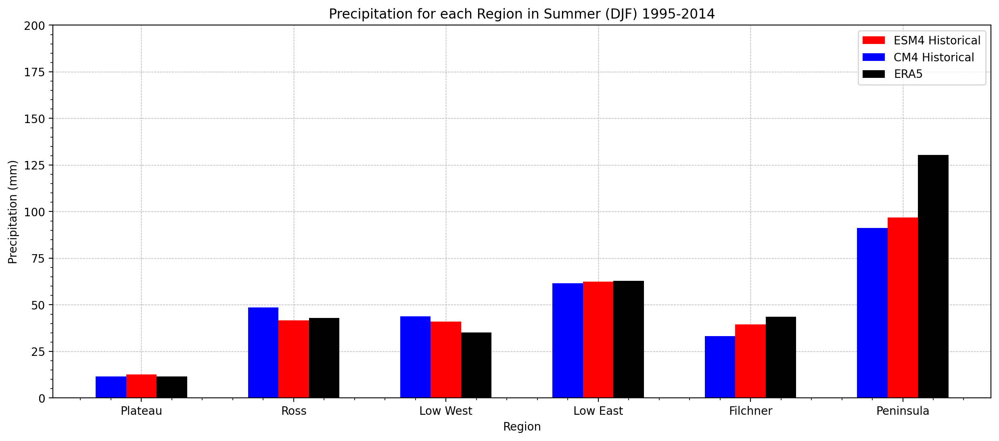

In [127]:

fig, ax= plt.subplots(figsize= (15,6))


X = ['Plateau','Ross','Low West','Low East', 'Filchner', 'Peninsula'] 
CM4_summer = [11.669509680359624,
48.47450910892803,
43.81406460015569,
61.65963321109302,
33.3035627118079,
91.23529930366203


] 
ESM4_summer = [12.667316579609178,
41.702034810441546,
40.973860246594995,
62.53823766019195,
39.58909623906948,
96.87359994859435

] 

ERA5_summer = [11.635876802756684,
42.967688306816854,
35.240873039583676,
62.76571596390568,
43.696290740626864,
130.31702663283795

       ]
X_axis = np.arange(len(X)) 
  
plt.bar(X_axis, ESM4_summer, 0.2, label = 'ESM4 Historical', color='r') 
plt.bar(X_axis - 0.2, CM4_summer, 0.2, label = 'CM4 Historical', color= 'blue') 
plt.bar(X_axis + 0.2, ERA5_summer, 0.2, label= 'ERA5', color= 'k')
ax.grid(linewidth=0.5, linestyle= '--')
ax.set_axisbelow(True)
plt.xticks(X_axis, X) 
plt.xlabel("Region") 
plt.ylabel("Precipitation (mm)") 
plt.title("Precipitation for each Region in Summer (DJF) 1995-2014") 
plt.legend() 
ax.minorticks_on()
plt.ylim(0,200)
plt.show() 








Text(0.5, 0.98, 'Precipitation for Summer (DJF) (mm) 1995-2014')

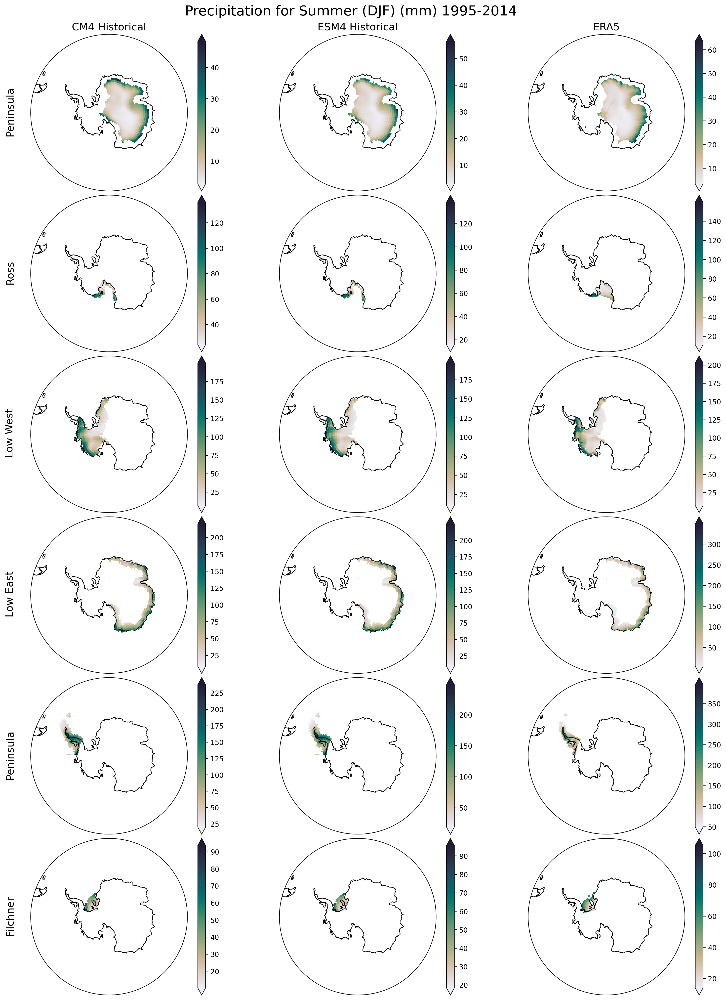

In [53]:
fig, ax = south_pole_map(cols=3, rows=6,fig_size=(15,20))



#CM4 Plots
plateau_precip_summer_CM4_spatial_95.plot(ax=ax[0,0],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.rain)
    
ross_precip_summer_CM4_spatial_95.plot(ax=ax[1,0],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.rain)
lowwest_precip_summer_CM4_spatial_95.plot(ax=ax[2,0],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.rain)
    
loweast_precip_summer_CM4_spatial_95.plot(ax=ax[3,0],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.rain)
peninsula_precip_summer_CM4_spatial_95.plot(ax=ax[4,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
filchner_precip_summer_CM4_spatial_95.plot(ax=ax[5,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
#ESM4 Plots

plateau_precip_summer_ESM4_spatial_95.plot(ax=ax[0,1],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.rain)
    
ross_precip_summer_ESM4_spatial_95.plot(ax=ax[1,1],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.rain)
lowwest_precip_summer_ESM4_spatial_95.plot(ax=ax[2,1],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.rain)
    
loweast_precip_summer_ESM4_spatial_95.plot(ax=ax[3,1],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.rain)
peninsula_precip_summer_ESM4_spatial_95.plot(ax=ax[4,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
filchner_precip_summer_ESM4_spatial_95.plot(ax=ax[5,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)

#ERA5 Plots
plateau_precip_summer_ERA5_spatial_95.plot(ax=ax[0,2],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.rain)
    
ross_precip_summer_ERA5_spatial_95.plot(ax=ax[1,2],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.rain)
lowwest_precip_summer_ERA5_spatial_95.plot(ax=ax[2,2],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.rain)
    
loweast_precip_summer_ERA5_spatial_95.plot(ax=ax[3,2],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.rain)
peninsula_precip_summer_ERA5_spatial_95.plot(ax=ax[4,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
filchner_precip_summer_ERA5_spatial_95.plot(ax=ax[5,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
ax[0,0].coastlines()
ax[1,0].coastlines()
ax[2,0].coastlines()
ax[3,0].coastlines()
ax[4,0].coastlines()
ax[5,0].coastlines()

ax[0,1].coastlines()
ax[1,1].coastlines()
ax[2,1].coastlines()
ax[3,1].coastlines()
ax[4,1].coastlines()
ax[5,1].coastlines()

ax[0,2].coastlines()
ax[1,2].coastlines()
ax[2,2].coastlines()
ax[3,2].coastlines()
ax[4,2].coastlines()
ax[5,2].coastlines()


ax[0,0].set_title('CM4 Historical',size=15)
ax[0,1].set_title('ESM4 Historical',size=15)
ax[0,2].set_title('ERA5',size=15)

ax[1,0].set_title('')
ax[2,0].set_title('')
ax[3,0].set_title('')
ax[4,0].set_title('')
ax[5,0].set_title('')

ax[1,1].set_title('')
ax[2,1].set_title('')
ax[3,1].set_title('')
ax[4,1].set_title('')
ax[5,1].set_title('')

ax[1,2].set_title('')
ax[2,2].set_title('')
ax[3,2].set_title('')
ax[4,2].set_title('')
ax[5,2].set_title('')

rows = ['Peninsula', 'Ross', 'Low West', 'Low East', 'Peninsula', 'Filchner']

for ax, row in zip(ax[:,0], rows):
    ax.annotate(row, xy=(-30, 115), 
                xycoords='axes points', ha='center', va='center', color='k', rotation=90, fontsize=15)

fig.suptitle('Precipitation for Summer (DJF) (mm) 1995-2014', fontsize=20)

In [96]:
plat_value_CM4_winter_95=print(plateau_precip_winter_CM4_95.values)
ross_value_CM4_winter_95= print(ross_precip_winter_CM4_95.values)
west_value_CM4_winter_95=print(lowwest_precip_winter_CM4_95.values)
east_value_CM4_winter_95=print(loweast_precip_winter_CM4_95.values)
filch_value_CM4_winter_95=print(filchner_precip_winter_CM4_95.values)
pen_value_CM4_winter_95=print(peninsula_precip_winter_CM4_95.values)

12.575616856338456
43.51891612750478
46.304888650774956
74.98496185289696
55.285907472716644
190.67089171148837


In [97]:
plat_value_ESM4_winter_95=print(plateau_precip_winter_ESM4_95.values)
ross_value_ESM4_winter_95= print(ross_precip_winter_ESM4_95.values)
west_value_ESM4_winter_95=print(lowwest_precip_winter_ESM4_95.values)
east_value_ESM4_winter_95=print(loweast_precip_winter_ESM4_95.values)
filch_value_ESM4_winter_95=print(filchner_precip_winter_ESM4_95.values)
pen_value_ESM4_winter_95=print(peninsula_precip_winter_ESM4_95.values)

14.507360866991803
44.257644267054275
49.53764118254185
79.40803369274363
56.32520479266532
180.44120154809207


In [98]:
plat_value_ERA5_winter_95=print(plateau_precip_winter_ERA5_95.values)
ross_value_ERA5_winter_95= print(ross_precip_winter_ERA5_95.values)
west_value_ERA5_winter_95=print(lowwest_precip_winter_ERA5_95.values)
east_value_ERA5_winter_95=print(loweast_precip_winter_ERA5_95.values)
filch_value_ERA5_winter_95=print(filchner_precip_winter_ERA5_95.values)
pen_value_ERA5_winter_95=print(peninsula_precip_winter_ERA5_95.values)

15.778284275438637
65.23226693971083
51.10117782605812
83.92043912317604
46.984451450407505
197.53496758639812


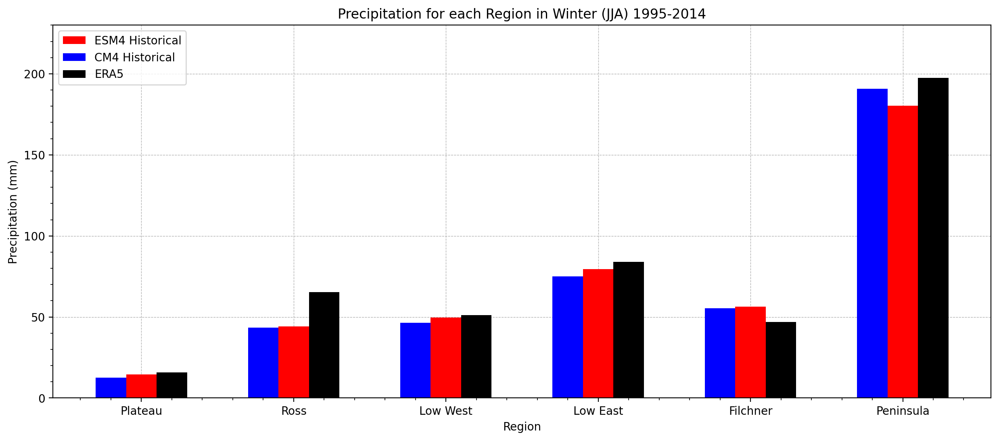

In [128]:

fig, ax= plt.subplots(figsize= (15,6))


X = ['Plateau','Ross','Low West','Low East', 'Filchner', 'Peninsula'] 
CM4_winter = [12.575616856338456,
43.51891612750478,
46.304888650774956,
74.98496185289696,
55.285907472716644,
190.67089171148837


] 
ESM4_winter = [14.507360866991803,
44.257644267054275,
49.53764118254185,
79.40803369274363,
56.32520479266532,
180.44120154809207

] 

ERA5_winter = [15.778284275438637,
65.23226693971083,
51.10117782605812,
83.92043912317604,
46.984451450407505,
197.53496758639812
]
X_axis = np.arange(len(X)) 
  
plt.bar(X_axis, ESM4_winter, 0.2, label = 'ESM4 Historical', color='red') 
plt.bar(X_axis - 0.2, CM4_winter, 0.2, label = 'CM4 Historical', color= 'blue') 
plt.bar(X_axis + 0.2, ERA5_winter, 0.2, label= 'ERA5', color= 'k')
ax.grid(linewidth=0.5, linestyle= '--')
ax.set_axisbelow(True)
plt.xticks(X_axis, X) 
plt.xlabel("Region") 
plt.ylabel("Precipitation (mm)") 
plt.title("Precipitation for each Region in Winter (JJA) 1995-2014") 
plt.legend() 
ax.minorticks_on()
plt.ylim(0,230)
plt.show() 





Text(0.5, 0.98, 'Precipitation for Winter (JJA) (mm) 1995-2014')

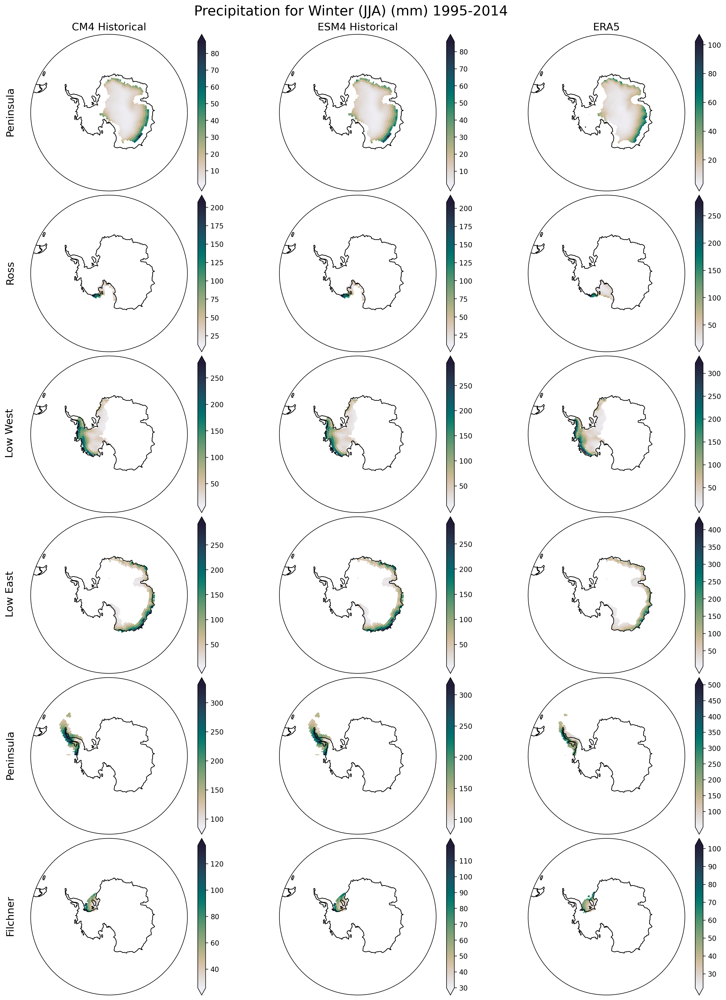

In [55]:
fig, ax = south_pole_map(cols=3, rows=6,fig_size=(15,20))



#CM4 Plots
plateau_precip_winter_CM4_spatial_95.plot(ax=ax[0,0],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.rain)
    
ross_precip_winter_CM4_spatial_95.plot(ax=ax[1,0],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.rain)
lowwest_precip_winter_CM4_spatial_95.plot(ax=ax[2,0],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.rain)
    
loweast_precip_winter_CM4_spatial_95.plot(ax=ax[3,0],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.rain)
peninsula_precip_winter_CM4_spatial_95.plot(ax=ax[4,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
filchner_precip_winter_CM4_spatial_95.plot(ax=ax[5,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
#ESM4 Plots

plateau_precip_winter_ESM4_spatial_95.plot(ax=ax[0,1],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.rain)
    
ross_precip_winter_ESM4_spatial_95.plot(ax=ax[1,1],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.rain)
lowwest_precip_winter_ESM4_spatial_95.plot(ax=ax[2,1],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.rain)
    
loweast_precip_winter_ESM4_spatial_95.plot(ax=ax[3,1],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.rain)
peninsula_precip_winter_ESM4_spatial_95.plot(ax=ax[4,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
filchner_precip_winter_ESM4_spatial_95.plot(ax=ax[5,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)

#ERA5 Plots
plateau_precip_winter_ERA5_spatial_95.plot(ax=ax[0,2],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.rain)
    
ross_precip_winter_ERA5_spatial_95.plot(ax=ax[1,2],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.rain)
lowwest_precip_winter_ERA5_spatial_95.plot(ax=ax[2,2],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.rain)
    
loweast_precip_winter_ERA5_spatial_95.plot(ax=ax[3,2],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.rain)
peninsula_precip_winter_ERA5_spatial_95.plot(ax=ax[4,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
filchner_precip_winter_ERA5_spatial_95.plot(ax=ax[5,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
ax[0,0].coastlines()
ax[1,0].coastlines()
ax[2,0].coastlines()
ax[3,0].coastlines()
ax[4,0].coastlines()
ax[5,0].coastlines()

ax[0,1].coastlines()
ax[1,1].coastlines()
ax[2,1].coastlines()
ax[3,1].coastlines()
ax[4,1].coastlines()
ax[5,1].coastlines()

ax[0,2].coastlines()
ax[1,2].coastlines()
ax[2,2].coastlines()
ax[3,2].coastlines()
ax[4,2].coastlines()
ax[5,2].coastlines()


ax[0,0].set_title('CM4 Historical',size=15)
ax[0,1].set_title('ESM4 Historical',size=15)
ax[0,2].set_title('ERA5',size=15)

ax[1,0].set_title('')
ax[2,0].set_title('')
ax[3,0].set_title('')
ax[4,0].set_title('')
ax[5,0].set_title('')

ax[1,1].set_title('')
ax[2,1].set_title('')
ax[3,1].set_title('')
ax[4,1].set_title('')
ax[5,1].set_title('')

ax[1,2].set_title('')
ax[2,2].set_title('')
ax[3,2].set_title('')
ax[4,2].set_title('')
ax[5,2].set_title('')
rows = ['Peninsula', 'Ross', 'Low West', 'Low East', 'Peninsula', 'Filchner']

for ax, row in zip(ax[:,0], rows):
    ax.annotate(row, xy=(-30, 115), 
                xycoords='axes points', ha='center', va='center', color='k', rotation=90, fontsize=15)

fig.suptitle('Precipitation for Winter (JJA) (mm) 1995-2014', fontsize=20)

In [100]:
plat_value_CM4_spring_95=print(plateau_precip_spring_CM4_95.values)
ross_value_CM4_spring_95= print(ross_precip_spring_CM4_95.values)
west_value_CM4_spring_95=print(lowwest_precip_spring_CM4_95.values)
east_value_CM4_spring_95=print(loweast_precip_spring_CM4_95.values)
filch_value_CM4_spring_95=print(filchner_precip_spring_CM4_95.values)
pen_value_CM4_spring_95=print(peninsula_precip_spring_CM4_95.values)

12.94208683175384
39.342089620186016
43.158824341662694
63.64448598178569
55.20988613861846
181.0439790948294


In [101]:
plat_value_ESM4_spring_95=print(plateau_precip_spring_ESM4_95.values)
ross_value_ESM4_spring_95= print(ross_precip_spring_ESM4_95.values)
west_value_ESM4_spring_95=print(lowwest_precip_spring_ESM4_95.values)
east_value_ESM4_spring_95=print(loweast_precip_spring_ESM4_95.values)
filch_value_ESM4_spring_95=print(filchner_precip_spring_ESM4_95.values)
pen_value_ESM4_spring_95=print(peninsula_precip_spring_ESM4_95.values)

14.423866296783672
37.77268679696135
46.36767575866543
62.47935426654294
60.586284278542735
181.0008597036358


In [102]:
plat_value_ERA5_spring_95=print(plateau_precip_spring_ERA5_95.values)
ross_value_ERA5_spring_95= print(ross_precip_spring_ERA5_95.values)
west_value_ERA5_spring_95=print(lowwest_precip_spring_ERA5_95.values)
east_value_ERA5_spring_95=print(loweast_precip_spring_ERA5_95.values)
filch_value_ERA5_spring_95=print(filchner_precip_spring_ERA5_95.values)
pen_value_ERA5_spring_95=print(peninsula_precip_spring_ERA5_95.values)

15.192566874611657
49.96697219030466
46.955533216532785
61.62200776452664
53.56455957808066
198.84186177514493


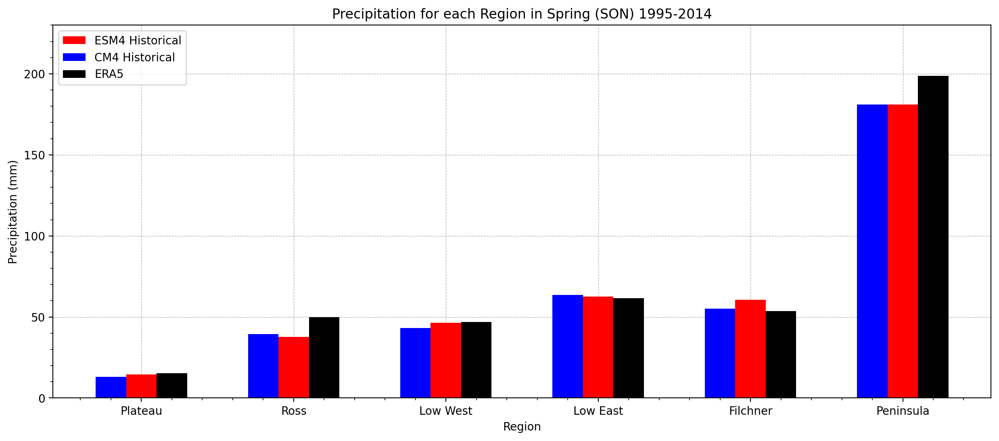

In [129]:

fig, ax= plt.subplots(figsize= (15,6))


X = ['Plateau','Ross','Low West','Low East', 'Filchner', 'Peninsula'] 
CM4_spring = [12.94208683175384,
39.342089620186016,
43.158824341662694,
63.64448598178569,
55.20988613861846,
181.0439790948294
] 
ESM4_spring = [14.423866296783672,
37.77268679696135,
46.36767575866543,
62.47935426654294,
60.586284278542735,
181.0008597036358
] 

ERA5_spring = [15.192566874611657,
49.96697219030466,
46.955533216532785,
61.62200776452664,
53.56455957808066,
198.84186177514493

]
X_axis = np.arange(len(X)) 
  
plt.bar(X_axis, ESM4_spring, 0.2, label = 'ESM4 Historical', color='r') 
plt.bar(X_axis - 0.2, CM4_spring, 0.2, label = 'CM4 Historical', color= 'blue') 
plt.bar(X_axis + 0.2, ERA5_spring, 0.2, label= 'ERA5', color= 'k')
ax.grid(linewidth=0.5, linestyle= '--')
ax.set_axisbelow(True)
plt.xticks(X_axis, X) 
plt.xlabel("Region") 
plt.ylabel("Precipitation (mm)") 
plt.title("Precipitation for each Region in Spring (SON) 1995-2014") 
plt.legend() 
ax.minorticks_on()
plt.ylim(0,230)
plt.show() 





Text(0.5, 0.98, 'Precipitation for Spring (SON) (mm) 1995-2014')

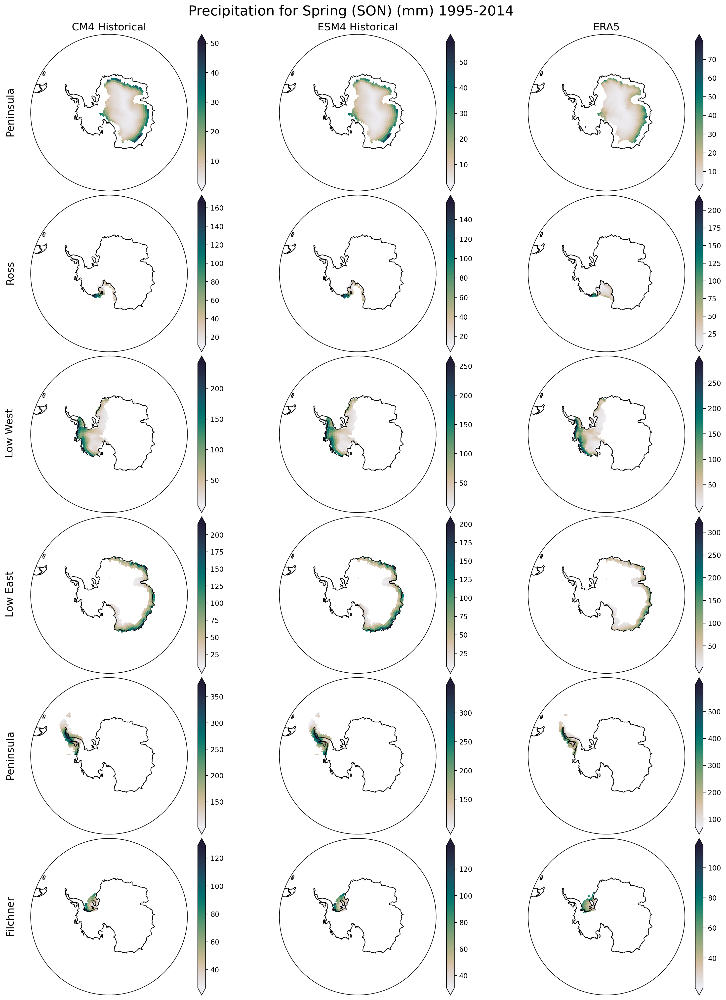

In [56]:
fig, ax = south_pole_map(cols=3, rows=6,fig_size=(15,20))



#CM4 Plots
plateau_precip_spring_CM4_spatial_95.plot(ax=ax[0,0],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.rain)
    
ross_precip_spring_CM4_spatial_95.plot(ax=ax[1,0],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.rain)
lowwest_precip_spring_CM4_spatial_95.plot(ax=ax[2,0],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.rain)
    
loweast_precip_spring_CM4_spatial_95.plot(ax=ax[3,0],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.rain)
peninsula_precip_spring_CM4_spatial_95.plot(ax=ax[4,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
filchner_precip_spring_CM4_spatial_95.plot(ax=ax[5,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
#ESM4 Plots

plateau_precip_spring_ESM4_spatial_95.plot(ax=ax[0,1],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.rain)
    
ross_precip_spring_ESM4_spatial_95.plot(ax=ax[1,1],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.rain)
lowwest_precip_spring_ESM4_spatial_95.plot(ax=ax[2,1],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.rain)
    
loweast_precip_spring_ESM4_spatial_95.plot(ax=ax[3,1],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.rain)
peninsula_precip_spring_ESM4_spatial_95.plot(ax=ax[4,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
filchner_precip_spring_ESM4_spatial_95.plot(ax=ax[5,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)

#ERA5 Plots
plateau_precip_spring_ERA5_spatial_95.plot(ax=ax[0,2],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.rain)
    
ross_precip_spring_ERA5_spatial_95.plot(ax=ax[1,2],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.rain)
lowwest_precip_spring_ERA5_spatial_95.plot(ax=ax[2,2],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.rain)
    
loweast_precip_spring_ERA5_spatial_95.plot(ax=ax[3,2],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.rain)
peninsula_precip_spring_ERA5_spatial_95.plot(ax=ax[4,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
filchner_precip_spring_ERA5_spatial_95.plot(ax=ax[5,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
ax[0,0].coastlines()
ax[1,0].coastlines()
ax[2,0].coastlines()
ax[3,0].coastlines()
ax[4,0].coastlines()
ax[5,0].coastlines()

ax[0,1].coastlines()
ax[1,1].coastlines()
ax[2,1].coastlines()
ax[3,1].coastlines()
ax[4,1].coastlines()
ax[5,1].coastlines()

ax[0,2].coastlines()
ax[1,2].coastlines()
ax[2,2].coastlines()
ax[3,2].coastlines()
ax[4,2].coastlines()
ax[5,2].coastlines()


ax[0,0].set_title('CM4 Historical',size=15)
ax[0,1].set_title('ESM4 Historical',size=15)
ax[0,2].set_title('ERA5',size=15)

ax[1,0].set_title('')
ax[2,0].set_title('')
ax[3,0].set_title('')
ax[4,0].set_title('')
ax[5,0].set_title('')

ax[1,1].set_title('')
ax[2,1].set_title('')
ax[3,1].set_title('')
ax[4,1].set_title('')
ax[5,1].set_title('')

ax[1,2].set_title('')
ax[2,2].set_title('')
ax[3,2].set_title('')
ax[4,2].set_title('')
ax[5,2].set_title('')
rows = ['Peninsula', 'Ross', 'Low West', 'Low East', 'Peninsula', 'Filchner']

for ax, row in zip(ax[:,0], rows):
    ax.annotate(row, xy=(-30, 115), 
                xycoords='axes points', ha='center', va='center', color='k', rotation=90, fontsize=15)

fig.suptitle('Precipitation for Spring (SON) (mm) 1995-2014', fontsize=20)

In [104]:
plat_value_CM4_fall_95=print(plateau_precip_fall_CM4_95.values)
ross_value_CM4_fall_95= print(ross_precip_fall_CM4_95.values)
west_value_CM4_fall_95=print(lowwest_precip_fall_CM4_95.values)
east_value_CM4_fall_95=print(loweast_precip_fall_CM4_95.values)
filch_value_CM4_fall_95=print(filchner_precip_fall_CM4_95.values)
pen_value_CM4_fall_95=print(peninsula_precip_fall_CM4_95.values)

17.06420505652204
65.68441477138549
59.672586555825546
84.10652366001159
52.99791350844316
172.36462659202516


In [105]:
plat_value_ESM4_fall_95=print(plateau_precip_fall_ESM4_95.values)
ross_value_ESM4_fall_95= print(ross_precip_fall_ESM4_95.values)
west_value_ESM4_fall_95=print(lowwest_precip_fall_ESM4_95.values)
east_value_ESM4_fall_95=print(loweast_precip_fall_ESM4_95.values)
filch_value_ESM4_fall_95=print(filchner_precip_fall_ESM4_95.values)
pen_value_ESM4_fall_95=print(peninsula_precip_fall_ESM4_95.values)

17.241330569959246
61.14590400829911
56.80521831382066
87.30568120954558
52.86820015171543
165.35784252919257


In [106]:
plat_value_ERA5_fall_95=print(plateau_precip_fall_ERA5_95.values)
ross_value_ERA5_fall_95= print(ross_precip_fall_ERA5_95.values)
west_value_ERA5_fall_95=print(lowwest_precip_fall_ERA5_95.values)
east_value_ERA5_fall_95=print(loweast_precip_fall_ERA5_95.values)
filch_value_ERA5_fall_95=print(filchner_precip_fall_ERA5_95.values)
pen_value_ERA5_fall_95=print(peninsula_precip_fall_ERA5_95.values)

19.225048483349383
65.10800092946738
56.62980797351338
81.47178639192134
51.31719565833919
216.36150309350342


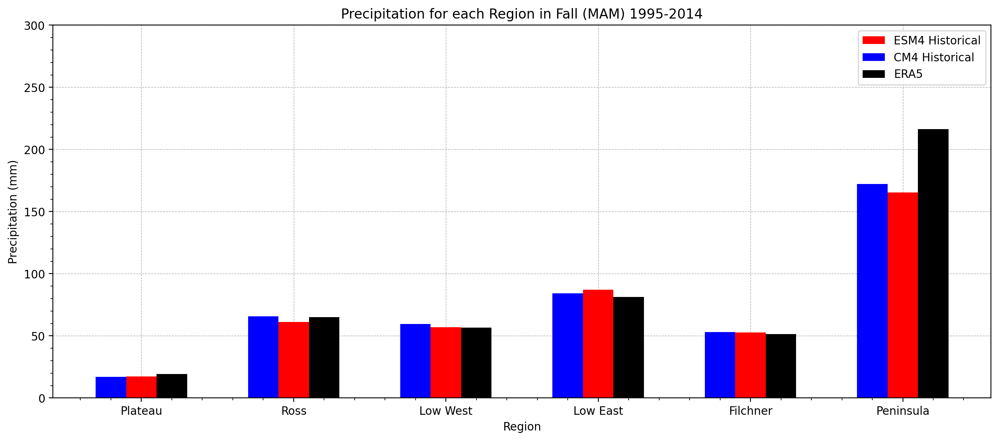

In [130]:

fig, ax= plt.subplots(figsize= (15,6))


X = ['Plateau','Ross','Low West','Low East', 'Filchner', 'Peninsula'] 
CM4_fall = [17.06420505652204,
65.68441477138549,
59.672586555825546,
84.10652366001159,
52.99791350844316,
172.36462659202516

] 
ESM4_fall = [17.241330569959246,
61.14590400829911,
56.80521831382066,
87.30568120954558,
52.86820015171543,
165.35784252919257

] 

ERA5_fall = [19.225048483349383,
65.10800092946738,
56.62980797351338,
81.47178639192134,
51.31719565833919,
216.36150309350342
]
X_axis = np.arange(len(X)) 
  
plt.bar(X_axis, ESM4_fall, 0.2, label = 'ESM4 Historical', color='red') 
plt.bar(X_axis - 0.2, CM4_fall, 0.2, label = 'CM4 Historical', color= 'blue') 
plt.bar(X_axis + 0.2, ERA5_fall, 0.2, label= 'ERA5', color= 'k')
ax.grid(linewidth=0.5, linestyle= '--')
ax.set_axisbelow(True)
plt.xticks(X_axis, X) 
plt.xlabel("Region") 
plt.ylabel("Precipitation (mm)") 
plt.title("Precipitation for each Region in Fall (MAM) 1995-2014") 
plt.legend() 
ax.minorticks_on()
plt.ylim(0,300)
plt.show() 





Text(0.5, 0.98, 'Precipitation for Fall (MAM) (mm) 1995-2014')

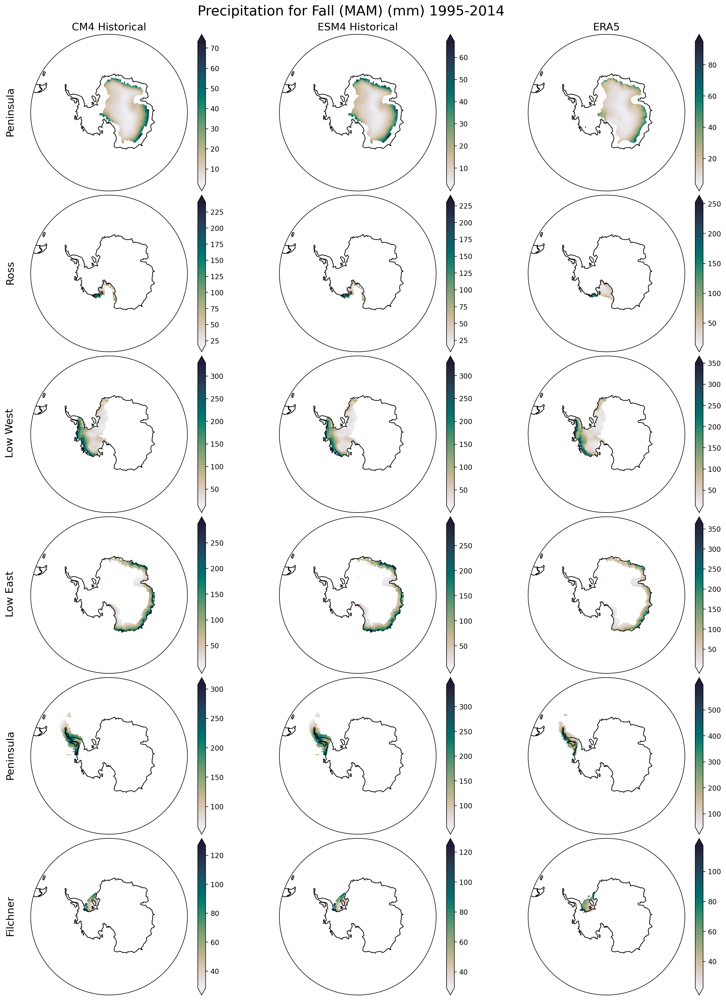

In [57]:
fig, ax = south_pole_map(cols=3, rows=6,fig_size=(15,20))



#CM4 Plots
plateau_precip_fall_CM4_spatial_95.plot(ax=ax[0,0],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.rain)
    
ross_precip_fall_CM4_spatial_95.plot(ax=ax[1,0],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.rain)
lowwest_precip_fall_CM4_spatial_95.plot(ax=ax[2,0],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.rain)
    
loweast_precip_fall_CM4_spatial_95.plot(ax=ax[3,0],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.rain)
peninsula_precip_fall_CM4_spatial_95.plot(ax=ax[4,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
filchner_precip_fall_CM4_spatial_95.plot(ax=ax[5,0],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
#ESM4 Plots

plateau_precip_fall_ESM4_spatial_95.plot(ax=ax[0,1],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.rain)
    
ross_precip_fall_ESM4_spatial_95.plot(ax=ax[1,1],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.rain)
lowwest_precip_fall_ESM4_spatial_95.plot(ax=ax[2,1],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.rain)
    
loweast_precip_fall_ESM4_spatial_95.plot(ax=ax[3,1],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.rain)
peninsula_precip_fall_ESM4_spatial_95.plot(ax=ax[4,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
filchner_precip_fall_ESM4_spatial_95.plot(ax=ax[5,1],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)

#ERA5 Plots
plateau_precip_fall_ERA5_spatial_95.plot(ax=ax[0,2],
              transform =ccrs.PlateCarree(),
        
              extend='both',
              cmap=cmocean.cm.rain)
    
ross_precip_fall_ERA5_spatial_95.plot(ax=ax[1,2],
              transform =ccrs.PlateCarree(),
             
              extend='both',
              cmap=cmocean.cm.rain)
lowwest_precip_fall_ERA5_spatial_95.plot(ax=ax[2,2],
               transform =ccrs.PlateCarree(),
               
               extend='both',
               cmap=cmocean.cm.rain)
    
loweast_precip_fall_ERA5_spatial_95.plot(ax=ax[3,2],
            transform =ccrs.PlateCarree(),
              
               extend='both',
               cmap= cmocean.cm.rain)
peninsula_precip_fall_ERA5_spatial_95.plot(ax=ax[4,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
filchner_precip_fall_ERA5_spatial_95.plot(ax=ax[5,2],
              transform =ccrs.PlateCarree(),
              
              extend='both',
              cmap=cmocean.cm.rain)
ax[0,0].coastlines()
ax[1,0].coastlines()
ax[2,0].coastlines()
ax[3,0].coastlines()
ax[4,0].coastlines()
ax[5,0].coastlines()

ax[0,1].coastlines()
ax[1,1].coastlines()
ax[2,1].coastlines()
ax[3,1].coastlines()
ax[4,1].coastlines()
ax[5,1].coastlines()

ax[0,2].coastlines()
ax[1,2].coastlines()
ax[2,2].coastlines()
ax[3,2].coastlines()
ax[4,2].coastlines()
ax[5,2].coastlines()


ax[0,0].set_title('CM4 Historical',size=15)
ax[0,1].set_title('ESM4 Historical',size=15)
ax[0,2].set_title('ERA5',size=15)

ax[1,0].set_title('')
ax[2,0].set_title('')
ax[3,0].set_title('')
ax[4,0].set_title('')
ax[5,0].set_title('')

ax[1,1].set_title('')
ax[2,1].set_title('')
ax[3,1].set_title('')
ax[4,1].set_title('')
ax[5,1].set_title('')

ax[1,2].set_title('')
ax[2,2].set_title('')
ax[3,2].set_title('')
ax[4,2].set_title('')
ax[5,2].set_title('')
rows = ['Peninsula', 'Ross', 'Low West', 'Low East', 'Peninsula', 'Filchner']

for ax, row in zip(ax[:,0], rows):
    ax.annotate(row, xy=(-30, 115), 
                xycoords='axes points', ha='center', va='center', color='k', rotation=90, fontsize=15)

fig.suptitle('Precipitation for Fall (MAM) (mm) 1995-2014', fontsize=20)

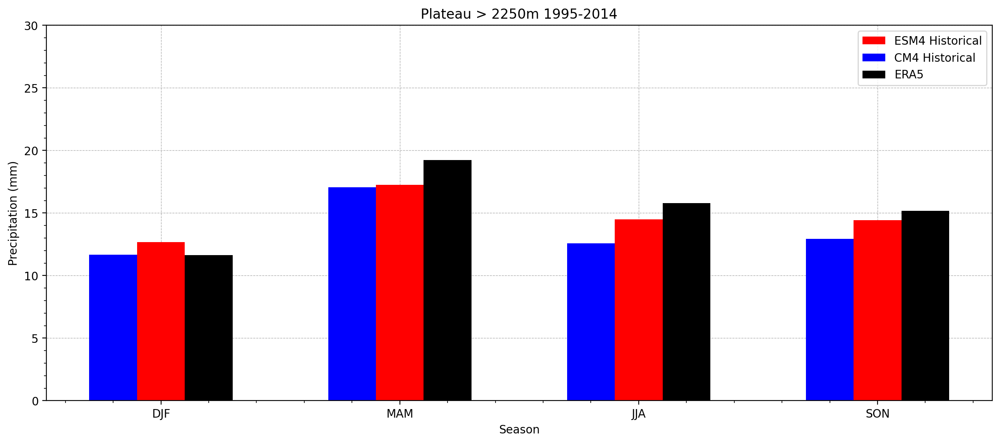

In [59]:
#plot of plateau data with season on x axis and precip on y
fig, ax= plt.subplots(figsize= (15,6))


X = ['DJF','MAM','JJA','SON'] 
CM4_all_seasons = [11.669509680359624,
                   17.06420505652204,
                   12.575616856338456,
                   12.94208683175384
    
]
                   
                   
                   

ESM4_all_seasons = [12.667316579609178,
                    17.241330569959246,
                    14.507360866991803,
                    14.423866296783672
    
]


ERA5_all_seasons = [11.635876802756684,
                    19.225048483349383,
                    15.778284275438637,
                    15.192566874611657
    
]
                    
                    
                    

X_axis = np.arange(len(X)) 
  
plt.bar(X_axis, ESM4_all_seasons, 0.2, label = 'ESM4 Historical', color='red') 
plt.bar(X_axis - 0.2, CM4_all_seasons, 0.2, label = 'CM4 Historical', color= 'blue') 
plt.bar(X_axis + 0.2, ERA5_all_seasons, 0.2, label= 'ERA5', color= 'k')
ax.grid(linewidth=0.5, linestyle= '--')
ax.set_axisbelow(True)
plt.xticks(X_axis, X) 
plt.xlabel("Season") 
plt.ylabel("Precipitation (mm)") 
plt.title("Plateau > 2250m 1995-2014") 
plt.legend() 
ax.minorticks_on()
plt.ylim(0,30)
plt.show() 





In [60]:
cm4_DJF_ave= (48.47450910892803+43.81406460015569+61.65963321109302+33.3035627118079+91.23529930366203)/5
esm4_DJF_ave=(41.702034810441546+40.973860246594995+62.53823766019195+39.58909623906948+96.87359994859435)/5
era5_DJF_ave=(42.967688306816854+35.240873039583676+62.76571596390568+43.696290740626864+130.31702663283795)/5

In [61]:
cm4_DJF_ave_val=print(cm4_DJF_ave)
esm4_DJF_ave_val= print(esm4_DJF_ave)
era5_DJF_ave_val=print(era5_DJF_ave)

55.697413787129335
56.335365780978464
62.997518936754204


In [62]:
cm4_MAM_ave=(65.68441477138549+59.672586555825546+84.10652366001159+52.99791350844316+172.36462659202516)/5
esm4_MAM_ave=(61.14590400829911+56.80521831382066+87.30568120954558+52.86820015171543+165.35784252919257)/5
era5_MAM_ave=(65.10800092946738+56.62980797351338+81.47178639192134+51.31719565833919+216.36150309350342)/5

In [63]:
cm4_MAM_ave_val=print(cm4_MAM_ave)
esm4_MAM_ave_val= print(esm4_MAM_ave)
era5_MAM_ave_val=print(era5_MAM_ave)

86.96521301753819
84.69656924251467
94.17765880934894


In [64]:
cm4_JJA_ave=(43.51891612750478+46.304888650774956+74.98496185289696+55.285907472716644+190.67089171148837)/5
esm4_JJA_ave=(44.257644267054275+49.53764118254185+79.40803369274363+56.32520479266532+180.44120154809207)/5
era5_JJA_ave=(65.23226693971083+51.10117782605812+83.92043912317604+46.984451450407505+197.53496758639812)/5

In [65]:
cm4_JJA_ave_val=print(cm4_JJA_ave)
esm4_JJA_ave_val= print(esm4_JJA_ave)
era5_JJA_ave_val=print(era5_JJA_ave)

82.15311316307634
81.99394509661943
88.95466058515012


In [66]:
cm4_SON_ave=(39.342089620186016+43.158824341662694+63.64448598178569+55.20988613861846+181.0439790948294)/5
esm4_SON_ave=(37.77268679696135+46.36767575866543+62.47935426654294+60.586284278542735+181.0008597036358)/5
era5_SON_ave=(49.96697219030466+46.955533216532785+61.62200776452664+53.56455957808066+198.84186177514493)/5

In [67]:
cm4_SON_ave_val=print(cm4_SON_ave)
esm4_SON_ave_val= print(esm4_SON_ave)
era5_SON_ave_val=print(era5_SON_ave)

76.47985303541645
77.64137216086965
82.19018690491794


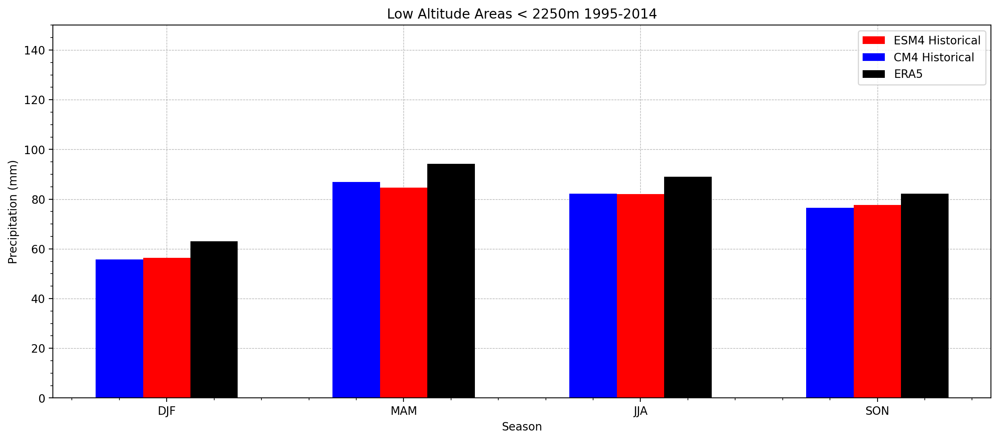

In [69]:
# averages for lower elevation with season on x axis and precip on y
fig, ax= plt.subplots(figsize= (15,6))


X = ['DJF','MAM','JJA','SON'] 
CM4_all_seasons = [55.697413787129335,
                   86.96521301753819,
                   82.15311316307634,
                   76.47985303541645
                   
                   
] 
ESM4_all_seasons = [56.335365780978464,
                    84.69656924251467,
                    81.99394509661943,
                    77.64137216086965
                    
                    
] 

ERA5_all_seasons = [62.997518936754204,
                    94.17765880934894,
                    88.95466058515012,
                    82.19018690491794


                    
                    
                    
]
X_axis = np.arange(len(X)) 
  
plt.bar(X_axis, ESM4_all_seasons, 0.2, label = 'ESM4 Historical', color='red') 
plt.bar(X_axis - 0.2, CM4_all_seasons, 0.2, label = 'CM4 Historical', color= 'blue') 
plt.bar(X_axis + 0.2, ERA5_all_seasons, 0.2, label= 'ERA5', color= 'k')
ax.grid(linewidth=0.5, linestyle= '--')
ax.set_axisbelow(True)
plt.xticks(X_axis, X) 
plt.xlabel("Season") 
plt.ylabel("Precipitation (mm)") 
plt.title("Low Altitude Areas < 2250m 1995-2014") 
plt.legend() 
ax.minorticks_on()
plt.ylim(0,150)
plt.show() 



